# Visualise global and spatial effects of best environmental predictors under different IMFs


### imports

In [1]:
import sys
import os

import numpy as np
import pandas as pd
import xarray as xr
import scipy as sci
import h5py as h5

import matplotlib.pyplot as plt
from matplotlib import ticker
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean.cm as cmo
from cmocean.tools import lighten

# regridding package
import xesmf as xe

# set hash characteristics
import matplotlib as mpl
mpl.rcParams['hatch.color'] = 'white'
mpl.rcParams['hatch.linewidth'] = 0.6


# print versions of packages
print("python version =",sys.version[:5])
print("numpy version =", np.__version__)
print("pandas version =", pd.__version__)
print("xarray version =", xr.__version__)
print("scipy version =", sci.__version__)
print("h5py version =", h5.__version__)
print("matplotlib version =", sys.modules[plt.__package__].__version__)
print("cmocean version =", sys.modules[cmo.__package__].__version__)
print("cartopy version =", sys.modules[ccrs.__package__].__version__)
print("xesmf version =", xe.__version__)


wrkdir = "/g/data/es60/SEAPODYM/pearse_GAMs"
os.chdir(wrkdir)


python version = 3.10.
numpy version = 2.2.5
pandas version = 2.3.3
xarray version = 2025.4.0
scipy version = 1.15.3
h5py version = 3.15.1
matplotlib version = 3.10.6
cmocean version = v3.0.3
cartopy version = 0.24.1
xesmf version = 0.8.10


### Load dask cluster

In [2]:
from dask.distributed import Client, LocalCluster

# Rule of thumb here:
# - 56 workers × 1 thread each (good isolation for NumPy/xarray)
# - ~8 GB per worker → 56 * 8 = 448 GB (leaves headroom for OS, Jupyter, scheduler)
cluster = LocalCluster(
    n_workers=28,
    threads_per_worker=1,
    memory_limit="8GB",
    # Optional niceties:
    dashboard_address=":8787",   # or ":0" for random free port
    processes=True,
)

client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 28
Total threads: 28,Total memory: 208.62 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34763,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:35829,Total threads: 1
Dashboard: /proxy/40259/status,Memory: 7.45 GiB
Nanny: tcp://127.0.0.1:41989,


### Load EMD of skipjack biomasses and key predictors

In [3]:
%%time

larvae_imfs = xr.open_dataset("EMD_forcings/SEAPODYM_imfs_larvae_CEEMDAN.nc").sel(lon=slice(120,250), lat=slice(-20,20))
juvenile_imfs = xr.open_dataset("EMD_forcings/SEAPODYM_imfs_juvenile_CEEMDAN.nc").sel(lon=slice(120,250), lat=slice(-20,20))
adult_imfs = xr.open_dataset("EMD_forcings/SEAPODYM_imfs_adult_CEEMDAN.nc").sel(lon=slice(120,250), lat=slice(-20,20)) * 1e3

pp_imfs = xr.open_dataset("EMD_forcings/SEAPODYM_imfs_pp_CEEMDAN.nc").sel(lon=slice(120,250), lat=slice(-20,20))
sst_imfs = xr.open_dataset("EMD_forcings/SEAPODYM_imfs_sst_CEEMDAN.nc").sel(lon=slice(120,250), lat=slice(-20,20))
T_L1_imfs = xr.open_dataset("EMD_forcings/SEAPODYM_imfs_T_L1_CEEMDAN.nc").sel(lon=slice(120,250), lat=slice(-20,20))
T_L2_imfs = xr.open_dataset("EMD_forcings/SEAPODYM_imfs_T_L2_CEEMDAN.nc").sel(lon=slice(120,250), lat=slice(-20,20))
O2_L2_imfs = xr.open_dataset("EMD_forcings/SEAPODYM_imfs_O2_L2_CEEMDAN.nc").sel(lon=slice(120,250), lat=slice(-20,20))

larvae_imfs

CPU times: user 4.85 s, sys: 2.97 s, total: 7.82 s
Wall time: 15.6 s


<xarray.Dataset> Size: 157MB
Dimensions:       (IMF: 4, time: 756, lat: 40, lon: 130)
Coordinates:
  * time          (time) datetime64[ns] 6kB 1960-01-15 1960-02-15 ... 2022-12-15
  * IMF           (IMF) int64 32B 1 2 3 4
  * lat           (lat) float64 320B -19.5 -18.5 -17.5 -16.5 ... 17.5 18.5 19.5
  * lon           (lon) float64 1kB 120.5 121.5 122.5 ... 247.5 248.5 249.5
Data variables:
    larvae_imfs   (IMF, time, lat, lon) float64 126MB ...
    larvae_anom   (time, lat, lon) float32 16MB ...
    larvae_detr   (time, lat, lon) float32 16MB ...
    larvae_trend  (lat, lon) float32 21kB ...

### compute trends in 3D

In [4]:
%%time

larvae_imfs['larvae_trend3D'] = larvae_imfs['larvae_anom'] - larvae_imfs['larvae_detr']
juvenile_imfs['juvenile_trend3D'] = juvenile_imfs['juvenile_anom'] - juvenile_imfs['juvenile_detr']
adult_imfs['adult_trend3D'] = adult_imfs['adult_anom'] - adult_imfs['adult_detr']
pp_imfs['pp_trend3D'] = pp_imfs['pp_anom'] - pp_imfs['pp_detr']
sst_imfs['sst_trend3D'] = sst_imfs['sst_anom'] - sst_imfs['sst_detr']
T_L1_imfs['T_L1_trend3D'] = T_L1_imfs['T_L1_anom'] - T_L1_imfs['T_L1_detr']
T_L2_imfs['T_L2_trend3D'] = T_L2_imfs['T_L2_anom'] - T_L2_imfs['T_L2_detr']
O2_L2_imfs['O2_L2_trend3D'] = O2_L2_imfs['O2_L2_anom'] - O2_L2_imfs['O2_L2_detr']


CPU times: user 6.25 s, sys: 3.39 s, total: 9.64 s
Wall time: 20.7 s


### Compute the standard deviations in each biomass class and each oceanographic predictor on:
- interannual
- decadal
- long-term timescales

##### collect annual and seasonal means

In [5]:
larvae_trend_annual =  (larvae_imfs['larvae_imfs'].sel(IMF=4) + larvae_imfs['larvae_trend3D']).resample(time='YS').mean(
    dim='time',
    skipna=True
)

juvenile_trend_annual =  (juvenile_imfs['juvenile_imfs'].sel(IMF=4) + juvenile_imfs['juvenile_trend3D']).resample(time='YS').mean(
    dim='time',
    skipna=True
)

adult_trend_annual =  (adult_imfs['adult_imfs'].sel(IMF=4) + adult_imfs['adult_trend3D']).resample(time='YS').mean(
    dim='time',
    skipna=True
)

larvae_seasonal = larvae_imfs.resample(time='QS-DEC').mean(dim='time', skipna=True)
juvenile_seasonal =  juvenile_imfs.resample(time='QS-DEC').mean(dim='time', skipna=True)
adult_seasonal =  adult_imfs.resample(time='QS-DEC').mean(dim='time', skipna=True)
pp_seasonal = pp_imfs.resample(time='QS-DEC').mean(dim='time', skipna=True)
sst_seasonal = sst_imfs.resample(time='QS-DEC').mean(dim='time', skipna=True)
T_L1_seasonal = T_L1_imfs.resample(time='QS-DEC').mean(dim='time', skipna=True)
T_L2_seasonal = T_L2_imfs.resample(time='QS-DEC').mean(dim='time', skipna=True)
O2_L2_seasonal = O2_L2_imfs.resample(time='QS-DEC').mean(dim='time', skipna=True)


/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


CPU times: user 30.3 s, sys: 4.68 s, total: 35 s
Wall time: 30.4 s


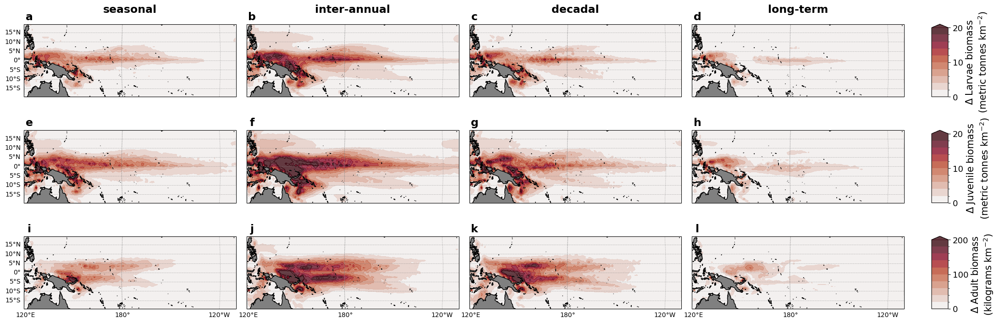

In [6]:
%%time

lons = larvae_imfs.coords['lon']
lats = larvae_imfs.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)
levs1 = np.arange(0,21,2)
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,21,2)
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,201,20)
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)

fig = plt.figure(figsize=(24,8))
gs = GridSpec(3,4)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[0,2], projection=proj)
ax4 = plt.subplot(gs[0,3], projection=proj)
ax5 = plt.subplot(gs[1,0], projection=proj)
ax6 = plt.subplot(gs[1,1], projection=proj)
ax7 = plt.subplot(gs[1,2], projection=proj)
ax8 = plt.subplot(gs[1,3], projection=proj)
ax9 = plt.subplot(gs[2,0], projection=proj)
ax10 = plt.subplot(gs[2,1], projection=proj)
ax11 = plt.subplot(gs[2,2], projection=proj)
ax12 = plt.subplot(gs[2,3], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'max'}
p1 = ax1.contourf(lons, lats, larvae_seasonal['larvae_imfs'].sel(IMF=1).std(dim='time'), **args1)
p2 = ax2.contourf(lons, lats, larvae_seasonal['larvae_imfs'].sel(IMF=2).std(dim='time'), **args1)
p3 = ax3.contourf(lons, lats, larvae_seasonal['larvae_imfs'].sel(IMF=3).std(dim='time'), **args1)
p4 = ax4.contourf(lons, lats, (larvae_seasonal['larvae_imfs'].sel(IMF=4) + larvae_seasonal['larvae_trend3D']).std(dim='time'), **args1)

args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'max'}
p5 = ax5.contourf(lons, lats, juvenile_seasonal['juvenile_imfs'].sel(IMF=1).std(dim='time'), **args2)
p6 = ax6.contourf(lons, lats, juvenile_seasonal['juvenile_imfs'].sel(IMF=2).std(dim='time'), **args2)
p7 = ax7.contourf(lons, lats, juvenile_seasonal['juvenile_imfs'].sel(IMF=3).std(dim='time'), **args2)
p8 = ax8.contourf(lons, lats, (juvenile_seasonal['juvenile_imfs'].sel(IMF=4) + juvenile_seasonal['juvenile_trend3D']).std(dim='time'), **args2)

args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'max'}
p9 = ax9.contourf(lons, lats, adult_seasonal['adult_imfs'].sel(IMF=1).std(dim='time'), **args3)
p10 = ax10.contourf(lons, lats, adult_seasonal['adult_imfs'].sel(IMF=2).std(dim='time'), **args3)
p11 = ax11.contourf(lons, lats, adult_seasonal['adult_imfs'].sel(IMF=3).std(dim='time'), **args3)
p12 = ax12.contourf(lons, lats, (adult_seasonal['adult_imfs'].sel(IMF=4) + adult_seasonal['adult_trend3D']).std(dim='time'), **args3)

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax7.add_feature(cfeature.LAND, color='grey', zorder=3)
ax7.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax8.add_feature(cfeature.LAND, color='grey', zorder=3)
ax8.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax9.add_feature(cfeature.LAND, color='grey', zorder=3)
ax9.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax10.add_feature(cfeature.LAND, color='grey', zorder=3)
ax10.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax11.add_feature(cfeature.LAND, color='grey', zorder=3)
ax11.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax12.add_feature(cfeature.LAND, color='grey', zorder=3)
ax12.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl7 = ax7.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl8 = ax8.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl9 = ax9.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl10 = ax10.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl11 = ax11.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl12 = ax12.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False; gl1.bottom_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.bottom_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False; gl3.bottom_labels = False; gl3.left_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.bottom_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False; gl5.bottom_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.bottom_labels = False; gl6.left_labels = False
gl7.top_labels = False; gl7.right_labels = False; gl7.bottom_labels = False; gl7.left_labels = False
gl8.top_labels = False; gl8.right_labels = False; gl8.bottom_labels = False; gl8.left_labels = False
gl9.top_labels = False; gl9.right_labels = False; 
gl10.top_labels = False; gl10.right_labels = False; gl10.left_labels = False
gl11.top_labels = False; gl11.right_labels = False; gl11.left_labels = False
gl12.top_labels = False; gl12.right_labels = False; gl12.left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"seasonal", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=ax1.transAxes)
plt.text(xx,yy,"inter-annual", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=ax2.transAxes)
plt.text(xx,yy,"decadal", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=ax3.transAxes)
plt.text(xx,yy,"long-term", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=ax4.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.025
ax4pos = ax4.get_position()
ax8pos = ax8.get_position()
ax12pos = ax12.get_position()
cbax1 = fig.add_axes([ax4pos.x1 + xx, ax4pos.y0, 0.015, ax4pos.y1 - ax4pos.y0])
cbax2 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax3 = fig.add_axes([ax12pos.x1 + xx, ax12pos.y0, 0.015, ax12pos.y1 - ax12pos.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Larvae biomass\n(metric tonnes km$^{-2}$)", fontsize=fslab)

cbar2 = plt.colorbar(p5, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Juvenile biomass\n(metric tonnes km$^{-2}$)", fontsize=fslab)

cbar3 = plt.colorbar(p9, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Adult biomass\n(kilograms km$^{-2}$)", fontsize=fslab)

xx = 0.025; yy = 1.1
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)
plt.text(xx,yy,"g", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax7.transAxes)
plt.text(xx,yy,"h", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax8.transAxes)
plt.text(xx,yy,"i", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax9.transAxes)
plt.text(xx,yy,"j", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax10.transAxes)
plt.text(xx,yy,"k", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax11.transAxes)
plt.text(xx,yy,"l", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax12.transAxes)

fig.savefig("./figures/BiomassSTDs_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/BiomassSTDs_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


CPU times: user 42 s, sys: 6.13 s, total: 48.2 s
Wall time: 40.2 s


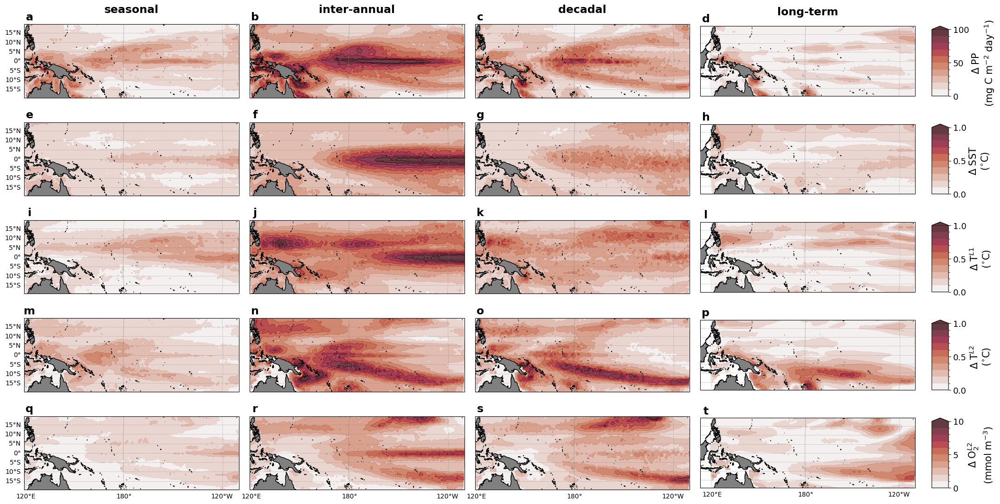

In [7]:
%%time

lons = larvae_imfs.coords['lon']
lats = larvae_imfs.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)
levs1 = np.arange(0,101,10)
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,21,2)*0.05
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,21,2)*0.05
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(0,21,2)*0.05
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(0,11,1)*1
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)

fig = plt.figure(figsize=(24,12))
gs = GridSpec(5,4)

axs = {}
plots = {}
grids = {}

for i in np.arange(5*4):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'max'}
args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'max'}
args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'max'}
args4 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm4, 'levels':levs4, 'extend':'max'}
args5 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm5, 'levels':levs5, 'extend':'max'}

n = 0
for i in np.arange(5):
    for j in np.arange(4):
        if i == 0:
            if j == 3:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, 
                                                            (pp_seasonal['pp_imfs'].sel(IMF=(j+1)) 
                                                             + pp_seasonal['pp_trend3D']).std(dim='time')*12, **args1)
            else:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, pp_seasonal['pp_imfs'].sel(IMF=(j+1)).std(dim='time')*12, **args1)
        if i == 1:
            if j == 3:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, 
                                                            (sst_seasonal['sst_imfs'].sel(IMF=(j+1)) 
                                                             + sst_seasonal['sst_trend3D']).std(dim='time'), **args2)
            else:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, sst_seasonal['sst_imfs'].sel(IMF=(j+1)).std(dim='time'), **args2)
        if i == 2:
            if j == 3:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, 
                                                            (T_L1_seasonal['T_L1_imfs'].sel(IMF=(j+1))
                                                            + T_L1_seasonal['T_L1_trend3D']).std(dim='time'), **args3)
            else:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, T_L1_seasonal['T_L1_imfs'].sel(IMF=(j+1)).std(dim='time'), **args3)
        if i == 3:
            if j == 3:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, 
                                                            (T_L2_seasonal['T_L2_imfs'].sel(IMF=(j+1))
                                                            + T_L2_seasonal['T_L2_trend3D']).std(dim='time'), **args4)
            else:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, T_L2_seasonal['T_L2_imfs'].sel(IMF=(j+1)).std(dim='time'), **args4)
        if i == 4:
            if j == 3:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, 
                                                            (O2_L2_seasonal['O2_L2_imfs'].sel(IMF=(j+1))
                                                            + O2_L2_seasonal['O2_L2_trend3D']).std(dim='time'), **args5)
            else:
                plots['p%i'%(n)] = axs['ax%i'%(n)].contourf(lons, lats, O2_L2_seasonal['O2_L2_imfs'].sel(IMF=(j+1)).std(dim='time'), **args5)
        n += 1
        
for i in np.arange(4*5):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 16:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 3, 5, 6, 7, 9, 10, 11, 13, 14, 15, 17, 18, 19]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"seasonal", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"inter-annual", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"decadal", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)
plt.text(xx,yy,"long-term", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax3'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax3pos = axs['ax3'].get_position()
ax7pos = axs['ax7'].get_position()
ax11pos = axs['ax11'].get_position()
ax15pos = axs['ax15'].get_position()
ax19pos = axs['ax19'].get_position()
cbax1 = fig.add_axes([ax3pos.x1 + xx, ax3pos.y0, 0.015, ax3pos.y1 - ax3pos.y0])
cbax2 = fig.add_axes([ax7pos.x1 + xx, ax7pos.y0, 0.015, ax7pos.y1 - ax7pos.y0])
cbax3 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])
cbax4 = fig.add_axes([ax15pos.x1 + xx, ax15pos.y0, 0.015, ax15pos.y1 - ax15pos.y0])
cbax5 = fig.add_axes([ax19pos.x1 + xx, ax19pos.y0, 0.015, ax19pos.y1 - ax19pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ PP\n(mg C m$^{-2}$ day$^{-1}$)", fontsize=fslab)

cbar2 = plt.colorbar(plots['p4'], cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ SST\n($^{\circ}$C)", fontsize=fslab)

cbar3 = plt.colorbar(plots['p8'], cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ T$^{L1}$\n($^{\circ}$C)", fontsize=fslab)

cbar4 = plt.colorbar(plots['p12'], cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("$\Delta$ T$^{L2}$\n($^{\circ}$C)", fontsize=fslab)

cbar5 = plt.colorbar(plots['p16'], cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("$\Delta$ O$_{2}^{L2}$\n(mmol m$^{-3}$)", fontsize=fslab)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't']
for i in np.arange(4*5):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/indicatorSTDs_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/indicatorSTDs_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


### Identify correlations and effect sizes of biomass variations with ENSO, IPO and CC

#### Load the ENSO, IPO and CC timeseries

In [8]:
%%time

dates = pd.date_range(start="1958-01-01", end="2024-12-31", freq="M")

##### IPO #######
### Comes from "obs_derive_IPO.ipynb"
ipo_da = xr.open_dataset(wrkdir + "/derived_IPO.nc")['IPO']
#ipo_pos = ipo_da.where(ipo_da > 0.0, other=0.0)
#ipo_neg = ipo_da.where(ipo_da < 0.0, other=0.0)

##### ENSO #######
'''
https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php
'''
enso_index = pd.read_csv(wrkdir + "/ONI.txt", delimiter=', ')
enso_subset = enso_index[(enso_index['YR']>1957) & (enso_index['YR']<2025)]
enso = pd.DataFrame(
    {"time": dates,
     "index": enso_subset.drop(columns=['SEAS','YR']).squeeze(),
    }
)
#enso['pos'] = enso['index'][enso['index']>0.0]
#enso['neg'] = enso['index'][enso['index']<0.0]

###### CO2 #######
atmco2 = pd.read_table(wrkdir + "/CO2.txt", skiprows=40, delimiter=',')
atmco2


CPU times: user 56.4 ms, sys: 15.9 ms, total: 72.3 ms
Wall time: 126 ms


<timed exec>:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
<timed exec>:13: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.


,year,month,date,measured,average
0,1958,3,1958.2027,315.71,314.44
1,1958,4,1958.2877,317.45,315.16
2,1958,5,1958.3699,317.51,314.69
3,1958,6,1958.4548,317.27,315.15
4,1958,7,1958.5370,315.87,315.20
...,...,...,...,...,...
807,2025,6,2025.4583,429.61,427.16
808,2025,7,2025.5417,427.87,427.46
809,2025,8,2025.6250,425.48,427.37
810,2025,9,2025.7083,424.37,427.78


#### prepare the ENSO, IPO and CO2 data so that it has the same time coordinate values as the SEAPODYM data

In [9]:
%%time

### ENSO ###
enso_da = xr.DataArray(
    enso['index'].to_numpy(),
    coords={'time': enso['time'].to_numpy()},
    dims='time',
    name='enso'
)
enso_for_corr = enso_da.sel(time=slice("1960-01-01","2022-12-31")).assign_coords({"time": larvae_imfs.coords['time'].values})

### IPO ###
ipo_for_corr = ipo_da.sel(time=slice("1960-01-01","2022-12-31")).assign_coords({"time": larvae_imfs.coords['time'].values})

### CO2 ###
co2_da = xr.DataArray(
    atmco2['average'].to_numpy(),
    coords={'time': atmco2['date'].to_numpy()},
    dims='time',
    name='co2'
)
co2_for_corr = co2_da.sel(time=slice(1960.0,2022.99)).assign_coords({"time": larvae_imfs.coords['time'].values})

enso_for_corr = enso_for_corr.resample(time='QS-DEC').mean(dim='time', skipna=True)
ipo_for_corr = ipo_for_corr.resample(time='QS-DEC').mean(dim='time', skipna=True)
co2_for_corr = co2_for_corr.resample(time='QS-DEC').mean(dim='time', skipna=True)


CPU times: user 352 ms, sys: 32.7 ms, total: 385 ms
Wall time: 374 ms


#### Compute the correlations

In [10]:
%%time

import warnings
warnings.filterwarnings("ignore")

### Larvae biomass ###
enso_larvae_corr = xr.corr(enso_for_corr, larvae_seasonal['larvae_imfs'].sel(IMF=2), dim=['time'])
ipo_larvae_corr = xr.corr(ipo_for_corr, larvae_seasonal['larvae_imfs'].sel(IMF=3), dim=['time'])
co2_larvae_corr = xr.corr(co2_for_corr, (larvae_seasonal['larvae_imfs'].sel(IMF=4) + larvae_seasonal['larvae_trend3D']), dim=['time'])

### Juvenile biomass ###
enso_juvenile_corr = xr.corr(enso_for_corr, juvenile_seasonal['juvenile_imfs'].sel(IMF=2), dim=['time'])
ipo_juvenile_corr = xr.corr(ipo_for_corr, juvenile_seasonal['juvenile_imfs'].sel(IMF=3), dim=['time'])
co2_juvenile_corr = xr.corr(co2_for_corr, juvenile_seasonal['juvenile_imfs'].sel(IMF=4) + juvenile_seasonal['juvenile_trend3D'], dim=['time'])

### Adult biomass ###
enso_adult_corr = xr.corr(enso_for_corr, adult_seasonal['adult_imfs'].sel(IMF=2), dim=['time'])
ipo_adult_corr = xr.corr(ipo_for_corr, adult_seasonal['adult_imfs'].sel(IMF=3), dim=['time'])
co2_adult_corr = xr.corr(co2_for_corr, adult_seasonal['adult_imfs'].sel(IMF=4) + adult_seasonal['adult_trend3D'], dim=['time'])

### PP ###
enso_pp_corr = xr.corr(enso_for_corr, pp_seasonal['pp_imfs'].sel(IMF=2), dim=['time'])
ipo_pp_corr = xr.corr(ipo_for_corr, pp_seasonal['pp_imfs'].sel(IMF=3), dim=['time'])
co2_pp_corr = xr.corr(co2_for_corr, pp_seasonal['pp_imfs'].sel(IMF=4) + pp_seasonal['pp_trend3D'], dim=['time'])

### SST ###
enso_sst_corr = xr.corr(enso_for_corr, sst_seasonal['sst_imfs'].sel(IMF=2), dim=['time'])
ipo_sst_corr = xr.corr(ipo_for_corr, sst_seasonal['sst_imfs'].sel(IMF=3), dim=['time'])
co2_sst_corr = xr.corr(co2_for_corr, sst_seasonal['sst_imfs'].sel(IMF=4) + sst_seasonal['sst_trend3D'], dim=['time'])

### T_L1 ###
enso_T_L1_corr = xr.corr(enso_for_corr, T_L1_seasonal['T_L1_imfs'].sel(IMF=2), dim=['time'])
ipo_T_L1_corr = xr.corr(ipo_for_corr, T_L1_seasonal['T_L1_imfs'].sel(IMF=3), dim=['time'])
co2_T_L1_corr = xr.corr(co2_for_corr, T_L1_seasonal['T_L1_imfs'].sel(IMF=4) + T_L1_seasonal['T_L1_trend3D'], dim=['time'])

### T_L2 ###
enso_T_L2_corr = xr.corr(enso_for_corr, T_L2_seasonal['T_L2_imfs'].sel(IMF=2), dim=['time'])
ipo_T_L2_corr = xr.corr(ipo_for_corr, T_L2_seasonal['T_L2_imfs'].sel(IMF=3), dim=['time'])
co2_T_L2_corr = xr.corr(co2_for_corr, T_L2_seasonal['T_L2_imfs'].sel(IMF=4) + T_L2_seasonal['T_L2_trend3D'], dim=['time'])

### O2_L2 ###
enso_O2_L2_corr = xr.corr(enso_for_corr, O2_L2_seasonal['O2_L2_imfs'].sel(IMF=2), dim=['time'])
ipo_O2_L2_corr = xr.corr(ipo_for_corr, O2_L2_seasonal['O2_L2_imfs'].sel(IMF=3), dim=['time'])
co2_O2_L2_corr = xr.corr(co2_for_corr, O2_L2_seasonal['O2_L2_imfs'].sel(IMF=4) + O2_L2_seasonal['O2_L2_trend3D'], dim=['time'])

CPU times: user 1.21 s, sys: 84.6 ms, total: 1.3 s
Wall time: 1 s


#### Compute effect sizes

In [11]:
%%time

### slope, slope standard error, and R2 of the effect
def xr_slope_stats(x, y, dim):
    """
    Regression of x on y:

        x = intercept + slope * y + residual

    Parameters
    ----------
    x : xr.DataArray
        Response variable.
    y : xr.DataArray
        Predictor/forcing variable.
    dim : str or list of str
        Regression dimension, normally ['time'].

    Returns
    -------
    slope, slope_se, r2 : xr.DataArray
    """

    # Align time coordinates and broadcast the forcing over the spatial grid
    x, y = xr.align(x, y, join="inner")
    x, y = xr.broadcast(x, y)

    # Pairwise-valid observations
    valid = np.isfinite(x) & np.isfinite(y)

    x_valid = x.where(valid)
    y_valid = y.where(valid)

    n = valid.sum(dim=dim)

    x_mean = x_valid.mean(dim=dim, skipna=True)
    y_mean = y_valid.mean(dim=dim, skipna=True)

    x_anom = x_valid - x_mean
    y_anom = y_valid - y_mean

    # Sum of squares and cross-products
    sxx = (y_anom**2).sum(dim=dim, skipna=True)
    sxy = (x_anom * y_anom).sum(dim=dim, skipna=True)

    slope = sxy / sxx
    intercept = x_mean - slope * y_mean

    # Residuals
    fitted = intercept + slope * y_valid
    residual = x_valid - fitted

    sse = (residual**2).sum(dim=dim, skipna=True)
    sst = (x_anom**2).sum(dim=dim, skipna=True)

    # Standard error of the slope
    dof = n - 2
    residual_variance = sse / dof
    slope_se = np.sqrt(residual_variance / sxx)

    # Coefficient of determination
    r2 = 1.0 - sse / sst

    regression_valid = (
        (n > 2)
        & (sxx > 0)
        & (sst > 0)
    )

    slope = slope.where(regression_valid)
    slope_se = slope_se.where(regression_valid)
    r2 = r2.where(regression_valid)

    return slope, slope_se, r2


### larvae ###
enso_larvae_slope, enso_larvae_slope_se, enso_larvae_slope_r2 = xr_slope_stats(
    larvae_seasonal['larvae_imfs'].sel(IMF=2),
    enso_for_corr,
    dim=['time']
)

ipo_larvae_slope, ipo_larvae_slope_se, ipo_larvae_slope_r2 = xr_slope_stats(
    larvae_seasonal['larvae_imfs'].sel(IMF=3),
    ipo_for_corr,
    dim=['time']
)

co2_larvae_slope, co2_larvae_slope_se, co2_larvae_slope_r2 = xr_slope_stats(
    larvae_seasonal['larvae_imfs'].sel(IMF=4)
    + larvae_seasonal['larvae_trend3D'],
    co2_for_corr,
    dim=['time']
)


### juvenile ###
enso_juvenile_slope, enso_juvenile_slope_se, enso_juvenile_slope_r2 = xr_slope_stats(
    juvenile_seasonal['juvenile_imfs'].sel(IMF=2),
    enso_for_corr,
    dim=['time']
)

ipo_juvenile_slope, ipo_juvenile_slope_se, ipo_juvenile_slope_r2 = xr_slope_stats(
    juvenile_seasonal['juvenile_imfs'].sel(IMF=3),
    ipo_for_corr,
    dim=['time']
)

co2_juvenile_slope, co2_juvenile_slope_se, co2_juvenile_slope_r2 = xr_slope_stats(
    juvenile_seasonal['juvenile_imfs'].sel(IMF=4)
    + juvenile_seasonal['juvenile_trend3D'],
    co2_for_corr,
    dim=['time']
)


### adult ###
enso_adult_slope, enso_adult_slope_se, enso_adult_slope_r2 = xr_slope_stats(
    adult_seasonal['adult_imfs'].sel(IMF=2),
    enso_for_corr,
    dim=['time']
)

ipo_adult_slope, ipo_adult_slope_se, ipo_adult_slope_r2 = xr_slope_stats(
    adult_seasonal['adult_imfs'].sel(IMF=3),
    ipo_for_corr,
    dim=['time']
)

co2_adult_slope, co2_adult_slope_se, co2_adult_slope_r2 = xr_slope_stats(
    adult_seasonal['adult_imfs'].sel(IMF=4)
    + adult_seasonal['adult_trend3D'],
    co2_for_corr,
    dim=['time']
)


### pp ###
enso_pp_slope, enso_pp_slope_se, enso_pp_slope_r2 = xr_slope_stats(
    pp_seasonal['pp_imfs'].sel(IMF=2),
    enso_for_corr,
    dim=['time']
)

ipo_pp_slope, ipo_pp_slope_se, ipo_pp_slope_r2 = xr_slope_stats(
    pp_seasonal['pp_imfs'].sel(IMF=3),
    ipo_for_corr,
    dim=['time']
)

co2_pp_slope, co2_pp_slope_se, co2_pp_slope_r2 = xr_slope_stats(
    pp_seasonal['pp_imfs'].sel(IMF=4)
    + pp_seasonal['pp_trend3D'],
    co2_for_corr,
    dim=['time']
)


### T_L1 ###
enso_T_L1_slope, enso_T_L1_slope_se, enso_T_L1_slope_r2 = xr_slope_stats(
    T_L1_seasonal['T_L1_imfs'].sel(IMF=2),
    enso_for_corr,
    dim=['time']
)

ipo_T_L1_slope, ipo_T_L1_slope_se, ipo_T_L1_slope_r2 = xr_slope_stats(
    T_L1_seasonal['T_L1_imfs'].sel(IMF=3),
    ipo_for_corr,
    dim=['time']
)

co2_T_L1_slope, co2_T_L1_slope_se, co2_T_L1_slope_r2 = xr_slope_stats(
    T_L1_seasonal['T_L1_imfs'].sel(IMF=4)
    + T_L1_seasonal['T_L1_trend3D'],
    co2_for_corr,
    dim=['time']
)


### T_L2 ###
enso_T_L2_slope, enso_T_L2_slope_se, enso_T_L2_slope_r2 = xr_slope_stats(
    T_L2_seasonal['T_L2_imfs'].sel(IMF=2),
    enso_for_corr,
    dim=['time']
)

ipo_T_L2_slope, ipo_T_L2_slope_se, ipo_T_L2_slope_r2 = xr_slope_stats(
    T_L2_seasonal['T_L2_imfs'].sel(IMF=3),
    ipo_for_corr,
    dim=['time']
)

co2_T_L2_slope, co2_T_L2_slope_se, co2_T_L2_slope_r2 = xr_slope_stats(
    T_L2_seasonal['T_L2_imfs'].sel(IMF=4)
    + T_L2_seasonal['T_L2_trend3D'],
    co2_for_corr,
    dim=['time']
)


### sst ###
enso_sst_slope, enso_sst_slope_se, enso_sst_slope_r2 = xr_slope_stats(
    sst_seasonal['sst_imfs'].sel(IMF=2),
    enso_for_corr,
    dim=['time']
)

ipo_sst_slope, ipo_sst_slope_se, ipo_sst_slope_r2 = xr_slope_stats(
    sst_seasonal['sst_imfs'].sel(IMF=3),
    ipo_for_corr,
    dim=['time']
)

co2_sst_slope, co2_sst_slope_se, co2_sst_slope_r2 = xr_slope_stats(
    sst_seasonal['sst_imfs'].sel(IMF=4)
    + sst_seasonal['sst_trend3D'],
    co2_for_corr,
    dim=['time']
)


### O2_L2 ###
enso_O2_L2_slope, enso_O2_L2_slope_se, enso_O2_L2_slope_r2 = xr_slope_stats(
    O2_L2_seasonal['O2_L2_imfs'].sel(IMF=2),
    enso_for_corr,
    dim=['time']
)

ipo_O2_L2_slope, ipo_O2_L2_slope_se, ipo_O2_L2_slope_r2 = xr_slope_stats(
    O2_L2_seasonal['O2_L2_imfs'].sel(IMF=3),
    ipo_for_corr,
    dim=['time']
)

co2_O2_L2_slope, co2_O2_L2_slope_se, co2_O2_L2_slope_r2 = xr_slope_stats(
    O2_L2_seasonal['O2_L2_imfs'].sel(IMF=4)
    + O2_L2_seasonal['O2_L2_trend3D'],
    co2_for_corr,
    dim=['time']
)


### Rescale CO2 slopes and their standard errors
# Current value preserves your existing factor of 50.
# Use co2_scale = 10.0 for effects per 10 ppm CO2.
co2_scale = 50.0

co2_larvae_slope = co2_larvae_slope * co2_scale
co2_larvae_slope_se = co2_larvae_slope_se * co2_scale

co2_juvenile_slope = co2_juvenile_slope * co2_scale
co2_juvenile_slope_se = co2_juvenile_slope_se * co2_scale

co2_adult_slope = co2_adult_slope * co2_scale
co2_adult_slope_se = co2_adult_slope_se * co2_scale

co2_pp_slope = co2_pp_slope * co2_scale
co2_pp_slope_se = co2_pp_slope_se * co2_scale

co2_sst_slope = co2_sst_slope * co2_scale
co2_sst_slope_se = co2_sst_slope_se * co2_scale

co2_T_L1_slope = co2_T_L1_slope * co2_scale
co2_T_L1_slope_se = co2_T_L1_slope_se * co2_scale

co2_T_L2_slope = co2_T_L2_slope * co2_scale
co2_T_L2_slope_se = co2_T_L2_slope_se * co2_scale

co2_O2_L2_slope = co2_O2_L2_slope * co2_scale
co2_O2_L2_slope_se = co2_O2_L2_slope_se * co2_scale

CPU times: user 2.35 s, sys: 712 ms, total: 3.06 s
Wall time: 2.39 s


0.10380598020125598
-0.3221893545746933


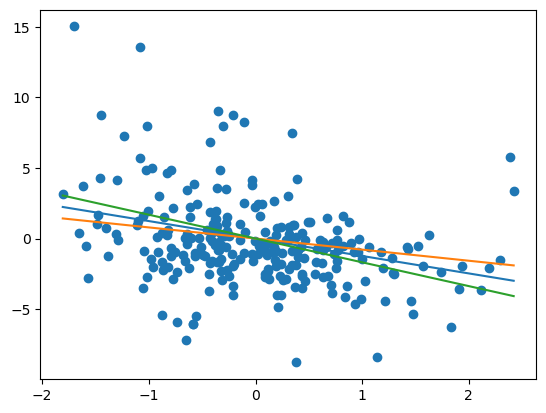

In [12]:
loni = 165; lati = -8
x = enso_for_corr
y = larvae_seasonal['larvae_imfs'].sel(IMF=2).sel(lon=loni,lat=lati,method='nearest')
xx = np.linspace(x.min().values, x.max().values, 100)
yy = xx * (enso_larvae_slope.sel(lon=loni,lat=lati,method='nearest')).values
yym = xx * ((enso_larvae_slope-enso_larvae_slope_se*1.96).sel(lon=loni,lat=lati,method='nearest')).values
yyp = xx * ((enso_larvae_slope+enso_larvae_slope_se*1.96).sel(lon=loni,lat=lati,method='nearest')).values

plt.figure()
plt.scatter(x, y)
plt.plot(xx, yy)
plt.plot(xx, yyp)
plt.plot(xx, yym)

print(enso_larvae_slope_r2.sel(lon=loni,lat=lati, method='nearest').values)
print(enso_larvae_corr.sel(lon=loni,lat=lati, method='nearest').values)

In [13]:
### What is the typical standard deviation of an ENSO or IPO on a seasonal timescale?

enso_std = enso_for_corr.std(dim='time')
ipo_std = ipo_for_corr.std(dim='time')
print(enso_std, ipo_std)


<xarray.DataArray 'enso' ()> Size: 8B
array(0.82220145) <xarray.DataArray 'IPO' ()> Size: 8B
array(0.37408847)


CPU times: user 21.1 s, sys: 3.03 s, total: 24.1 s
Wall time: 20.1 s


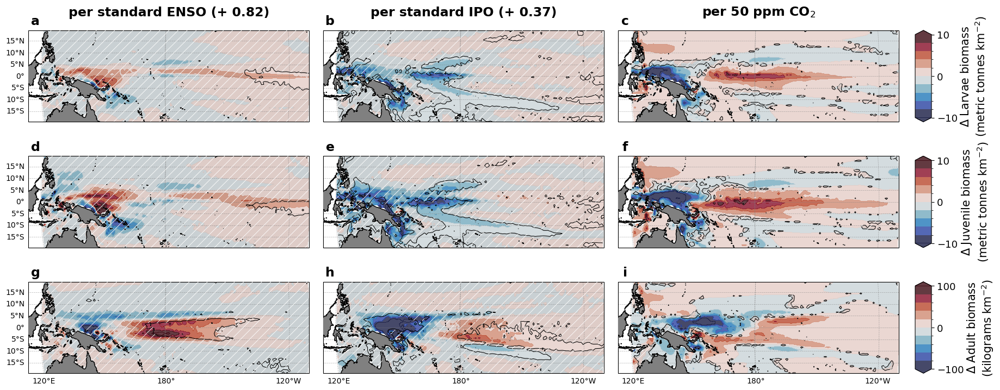

In [14]:
%%time

lons = larvae_imfs.coords['lon']
lats = larvae_imfs.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-10,11,2)
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,2)
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(-100,101,20)
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)

fig = plt.figure(figsize=(20,8))
gs = GridSpec(3,3)

axs = {}
plots = {}
conts = {}
grids = {}

for i in np.arange(3*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'both'}
args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}
argsH = {'transform':ccrs.PlateCarree(), 'levels': [0.5, 1.5], 'colors': 'none', 'hatches': ['//'], 'zorder':10, "alpha":0.05}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_larvae_slope * enso_std.values, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_slope * ipo_std.values, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_larvae_slope, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_juvenile_slope * enso_std.values, **args2)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_juvenile_slope * ipo_std.values, **args2)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_juvenile_slope, **args2)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_adult_slope * enso_std.values, **args3)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_adult_slope * ipo_std.values, **args3)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_adult_slope, **args3)

plots['h0'] = axs['ax0'].contourf(lons, lats, enso_larvae_slope_r2<0.3, **argsH)
plots['h1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_slope_r2<0.3, **argsH)
plots['h2'] = axs['ax2'].contourf(lons, lats, co2_larvae_slope_r2<0.3, **argsH)

plots['h3'] = axs['ax3'].contourf(lons, lats, enso_juvenile_slope_r2<0.3, **argsH)
plots['h4'] = axs['ax4'].contourf(lons, lats, ipo_juvenile_slope_r2<0.3, **argsH)
plots['h5'] = axs['ax5'].contourf(lons, lats, co2_juvenile_slope_r2<0.3, **argsH)

plots['h6'] = axs['ax6'].contourf(lons, lats, enso_adult_slope_r2<0.3, **argsH)
plots['h7'] = axs['ax7'].contourf(lons, lats, ipo_adult_slope_r2<0.3, **argsH)
plots['h8'] = axs['ax8'].contourf(lons, lats, co2_adult_slope_r2<0.3, **argsH)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_larvae_slope_r2, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_larvae_slope_r2, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_larvae_slope_r2, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_juvenile_slope_r2, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_juvenile_slope_r2, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_juvenile_slope_r2, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_adult_slope_r2, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_adult_slope_r2, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_adult_slope_r2, **argsC)

for i in np.arange(3*3):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 6:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Larvae biomass\n(metric tonnes km$^{-2}$)", fontsize=fslab)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Juvenile biomass\n(metric tonnes km$^{-2}$)", fontsize=fslab)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Adult biomass\n(kilograms km$^{-2}$)", fontsize=fslab)


xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
for i in np.arange(3*3):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/Biomass_effectsizes_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/Biomass_effectsizes_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 26.9 s, sys: 4.25 s, total: 31.2 s
Wall time: 25.8 s


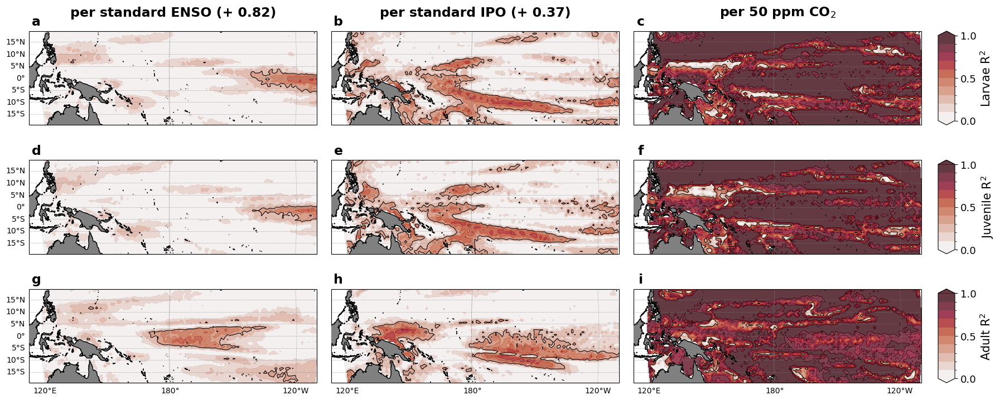

In [15]:
%%time


lons = larvae_imfs.coords['lon']
lats = larvae_imfs.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)
levs1 = np.arange(0,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,11,1)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,11,1)*0.1
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)

fig = plt.figure(figsize=(20,8))
gs = GridSpec(3,3)

axs = {}
plots = {}
grids = {}

for i in np.arange(3*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'both'}
args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_larvae_slope_r2, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_slope_r2, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_larvae_slope_r2, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_juvenile_slope_r2, **args2)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_juvenile_slope_r2, **args2)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_juvenile_slope_r2, **args2)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_adult_slope_r2, **args3)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_adult_slope_r2, **args3)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_adult_slope_r2, **args3)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_larvae_slope_r2, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_larvae_slope_r2, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_larvae_slope_r2, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_juvenile_slope_r2, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_juvenile_slope_r2, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_juvenile_slope_r2, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_adult_slope_r2, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_adult_slope_r2, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_adult_slope_r2, **argsC)

for i in np.arange(3*3):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 6:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Larvae R$^2$", fontsize=fslab)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("Juvenile R$^2$", fontsize=fslab)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("Adult R$^2$", fontsize=fslab)


xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
for i in np.arange(3*3):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/Biomass_effectsizesR2_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/Biomass_effectsizesR2_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 34.1 s, sys: 4.92 s, total: 39 s
Wall time: 32.6 s


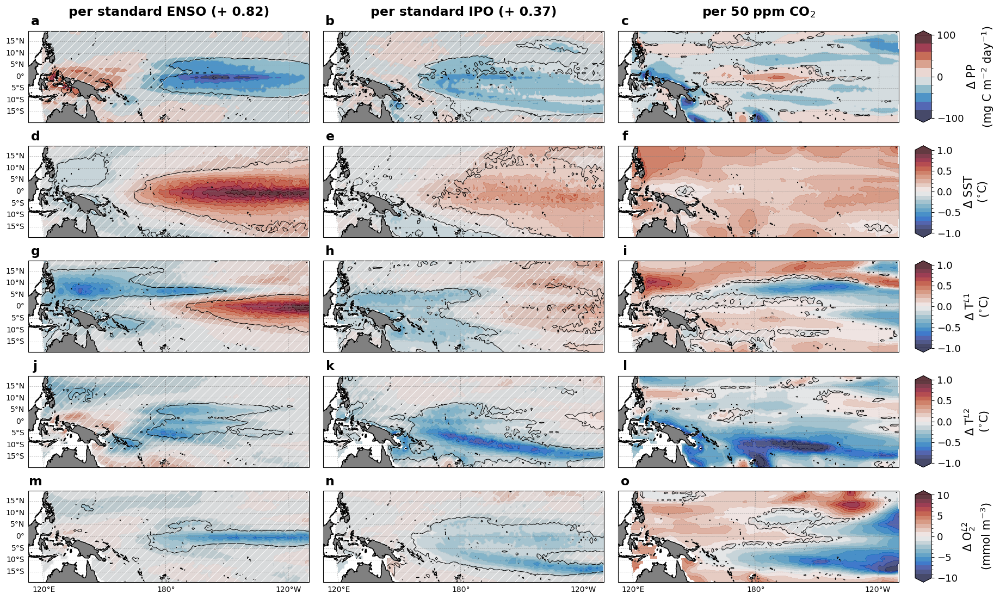

In [16]:
%%time

lons = larvae_imfs.coords['lon']
lats = larvae_imfs.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-100,101,20)
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-20,21,2)*0.05
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(-20,21,2)*0.05
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(-20,21,2)*0.05
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(-10,11,1)*1
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(5,3)

axs = {}
plots = {}
grids = {}

for i in np.arange(5*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'both'}
args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'both'}
args4 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm4, 'levels':levs4, 'extend':'both'}
args5 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm5, 'levels':levs5, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}
argsH = {'transform':ccrs.PlateCarree(), 'levels': [0.5, 1.5], 'colors': 'none', 'hatches': ['//'], 'zorder':10, "alpha":0.05}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_pp_slope*12 * enso_std.values, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_pp_slope*12 * ipo_std.values, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_pp_slope*12, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_sst_slope * enso_std.values, **args2)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_sst_slope * ipo_std.values, **args2)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_sst_slope, **args2)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_T_L1_slope * enso_std.values, **args3)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_T_L1_slope * ipo_std.values, **args3)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_T_L1_slope, **args3)

plots['p9'] = axs['ax9'].contourf(lons, lats, enso_T_L2_slope * enso_std.values, **args4)
plots['p10'] = axs['ax10'].contourf(lons, lats, ipo_T_L2_slope * ipo_std.values, **args4)
plots['p11'] = axs['ax11'].contourf(lons, lats, co2_T_L2_slope, **args4)

plots['p12'] = axs['ax12'].contourf(lons, lats, enso_O2_L2_slope * enso_std.values, **args5)
plots['p13'] = axs['ax13'].contourf(lons, lats, ipo_O2_L2_slope * ipo_std.values, **args5)
plots['p14'] = axs['ax14'].contourf(lons, lats, co2_O2_L2_slope, **args5)

plots['h0'] = axs['ax0'].contourf(lons, lats, enso_pp_slope_r2<0.3, **argsH)
plots['h1'] = axs['ax1'].contourf(lons, lats, ipo_pp_slope_r2<0.3, **argsH)
plots['h2'] = axs['ax2'].contourf(lons, lats, co2_pp_slope_r2<0.3, **argsH)

plots['h3'] = axs['ax3'].contourf(lons, lats, enso_sst_slope_r2<0.3, **argsH)
plots['h4'] = axs['ax4'].contourf(lons, lats, ipo_sst_slope_r2<0.3, **argsH)
plots['h5'] = axs['ax5'].contourf(lons, lats, co2_sst_slope_r2<0.3, **argsH)

plots['h6'] = axs['ax6'].contourf(lons, lats, enso_T_L1_slope_r2<0.3, **argsH)
plots['h7'] = axs['ax7'].contourf(lons, lats, ipo_T_L1_slope_r2<0.3, **argsH)
plots['h8'] = axs['ax8'].contourf(lons, lats, co2_T_L1_slope_r2<0.3, **argsH)

plots['h9'] = axs['ax9'].contourf(lons, lats, enso_T_L2_slope_r2<0.3, **argsH)
plots['h10'] = axs['ax10'].contourf(lons, lats, ipo_T_L2_slope_r2<0.3, **argsH)
plots['h11'] = axs['ax11'].contourf(lons, lats, co2_T_L2_slope_r2<0.3, **argsH)

plots['h12'] = axs['ax12'].contourf(lons, lats, enso_O2_L2_slope_r2<0.3, **argsH)
plots['h13'] = axs['ax13'].contourf(lons, lats, ipo_O2_L2_slope_r2<0.3, **argsH)
plots['h14'] = axs['ax14'].contourf(lons, lats, co2_O2_L2_slope_r2<0.3, **argsH)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_pp_slope_r2, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_pp_slope_r2, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_pp_slope_r2, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_sst_slope_r2, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_sst_slope_r2, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_sst_slope_r2, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_T_L1_slope_r2, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_T_L1_slope_r2, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_T_L1_slope_r2, **argsC)

plots['c9'] = axs['ax9'].contour(lons, lats, enso_T_L2_slope_r2, **argsC)
plots['c10'] = axs['ax10'].contour(lons, lats, ipo_T_L2_slope_r2, **argsC)
plots['c11'] = axs['ax11'].contour(lons, lats, co2_T_L2_slope_r2, **argsC)

plots['c12'] = axs['ax12'].contour(lons, lats, enso_O2_L2_slope_r2, **argsC)
plots['c13'] = axs['ax13'].contour(lons, lats, ipo_O2_L2_slope_r2, **argsC)
plots['c14'] = axs['ax14'].contour(lons, lats, co2_O2_L2_slope_r2, **argsC)

for i in np.arange(3*5):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 12:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8, 10, 11, 13, 14]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
ax11pos = axs['ax11'].get_position()
ax14pos = axs['ax14'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax4 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])
cbax5 = fig.add_axes([ax14pos.x1 + xx, ax14pos.y0, 0.015, ax14pos.y1 - ax14pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ PP\n(mg C m$^{-2}$ day$^{-1}$)", fontsize=fslab)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ SST\n($^{\circ}$C)", fontsize=fslab)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ T$^{L1}$\n($^{\circ}$C)", fontsize=fslab)

cbar4 = plt.colorbar(plots['p9'], cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("$\Delta$ T$^{L2}$\n($^{\circ}$C)", fontsize=fslab)

cbar5 = plt.colorbar(plots['p12'], cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("$\Delta$ O$_{2}^{L2}$\n(mmol m$^{-3}$)", fontsize=fslab)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o']
for i in np.arange(3*5):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/indicator_effectsizes_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/indicator_effectsizes_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


CPU times: user 42.2 s, sys: 6.47 s, total: 48.6 s
Wall time: 40.5 s


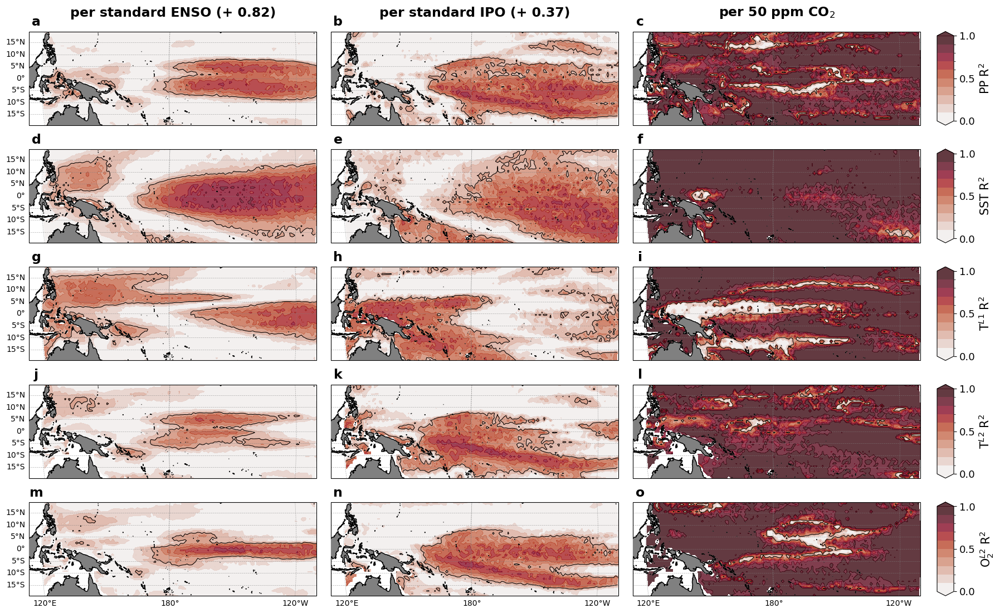

In [17]:
%%time

lons = larvae_imfs.coords['lon']
lats = larvae_imfs.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)
levs1 = np.arange(0,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,11,1)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,11,1)*0.1
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(0,11,1)*0.1
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(0,11,1)*0.1
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(5,3)

axs = {}
plots = {}
grids = {}

for i in np.arange(5*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'both'}
args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'both'}
args4 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm4, 'levels':levs4, 'extend':'both'}
args5 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm5, 'levels':levs5, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_pp_slope_r2, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_pp_slope_r2, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_pp_slope_r2, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_sst_slope_r2, **args2)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_sst_slope_r2, **args2)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_sst_slope_r2, **args2)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_T_L1_slope_r2, **args3)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_T_L1_slope_r2, **args3)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_T_L1_slope_r2, **args3)

plots['p9'] = axs['ax9'].contourf(lons, lats, enso_T_L2_slope_r2, **args4)
plots['p10'] = axs['ax10'].contourf(lons, lats, ipo_T_L2_slope_r2, **args4)
plots['p11'] = axs['ax11'].contourf(lons, lats, co2_T_L2_slope_r2, **args4)

plots['p12'] = axs['ax12'].contourf(lons, lats, enso_O2_L2_slope_r2, **args5)
plots['p13'] = axs['ax13'].contourf(lons, lats, ipo_O2_L2_slope_r2, **args5)
plots['p14'] = axs['ax14'].contourf(lons, lats, co2_O2_L2_slope_r2, **args5)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_pp_slope_r2, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_pp_slope_r2, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_pp_slope_r2, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_sst_slope_r2, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_sst_slope_r2, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_sst_slope_r2, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_T_L1_slope_r2, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_T_L1_slope_r2, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_T_L1_slope_r2, **argsC)

plots['c9'] = axs['ax9'].contour(lons, lats, enso_T_L2_slope_r2, **argsC)
plots['c10'] = axs['ax10'].contour(lons, lats, ipo_T_L2_slope_r2, **argsC)
plots['c11'] = axs['ax11'].contour(lons, lats, co2_T_L2_slope_r2, **argsC)

plots['c12'] = axs['ax12'].contour(lons, lats, enso_O2_L2_slope_r2, **argsC)
plots['c13'] = axs['ax13'].contour(lons, lats, ipo_O2_L2_slope_r2, **argsC)
plots['c14'] = axs['ax14'].contour(lons, lats, co2_O2_L2_slope_r2, **argsC)

for i in np.arange(3*5):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 12:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8, 10, 11, 13, 14]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
ax11pos = axs['ax11'].get_position()
ax14pos = axs['ax14'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax4 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])
cbax5 = fig.add_axes([ax14pos.x1 + xx, ax14pos.y0, 0.015, ax14pos.y1 - ax14pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("PP R$^2$", fontsize=fslab)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("SST R$^2$", fontsize=fslab)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("T$^{L1}$ R$^2$", fontsize=fslab)

cbar4 = plt.colorbar(plots['p9'], cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("T$^{L2}$ R$^2$", fontsize=fslab)

cbar5 = plt.colorbar(plots['p12'], cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("O$_{2}^{L2}$ R$^2$", fontsize=fslab)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o']
for i in np.arange(3*5):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/indicator_effectsizesR2_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/indicator_effectsizesR2_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


### Assess how predictors affect skipjack biomasses under different climate signals

#### load the data

##### (generated from skipjack_GAMs_SEAPODYM_IMFs_predictions.Rmd)

In [18]:
%%time

hf_larvae = pd.read_csv("anomalous_values_GAM_predictions_larvaeHF.csv")
mf_larvae = pd.read_csv("anomalous_values_GAM_predictions_larvaeMF.csv")
lf_larvae = pd.read_csv("anomalous_values_GAM_predictions_larvaeLF.csv")
tr_larvae = pd.read_csv("anomalous_values_GAM_predictions_larvaeT.csv")

hf_juvenile = pd.read_csv("anomalous_values_GAM_predictions_juvenileHF.csv")
mf_juvenile = pd.read_csv("anomalous_values_GAM_predictions_juvenileMF.csv")
lf_juvenile = pd.read_csv("anomalous_values_GAM_predictions_juvenileLF.csv")
tr_juvenile = pd.read_csv("anomalous_values_GAM_predictions_juvenileT.csv")

hf_adult = pd.read_csv("anomalous_values_GAM_predictions_adultHF.csv")
mf_adult = pd.read_csv("anomalous_values_GAM_predictions_adultMF.csv")
lf_adult = pd.read_csv("anomalous_values_GAM_predictions_adultLF.csv")
tr_adult = pd.read_csv("anomalous_values_GAM_predictions_adultT.csv")

mf_adult


CPU times: user 1min 11s, sys: 10.3 s, total: 1min 21s
Wall time: 1min 6s


,lon,lat,season_year,season,pp,sst,T_L1,T_L2,O2_L2,adultTF_MF,...,larvaeTF_T_L1,larvaeTF_sst,larvaeTF_O2_L2,larvaeTF_pp,larvaeTF_intercept,adultTF_T_L1,adultTF_sst,adultTF_O2_L2,adultTF_T_L2,adultTF_intercept
0,120.5,-19.5,1,DJF,-4.249275,-0.052961,-0.158168,NaN,NaN,NaN,...,NaN,NaN,0,NaN,-0.053244,NaN,NaN,NaN,NaN,-0.000712
1,120.5,-19.5,1,JJA,0.842082,0.128468,0.050040,NaN,NaN,NaN,...,NaN,NaN,0,NaN,-0.053244,NaN,NaN,NaN,NaN,-0.000712
2,120.5,-19.5,1,MAM,-2.081520,0.151080,0.045537,NaN,NaN,NaN,...,NaN,NaN,0,NaN,-0.053244,NaN,NaN,NaN,NaN,-0.000712
3,120.5,-19.5,1,SON,1.946178,-0.275020,-0.184264,NaN,NaN,NaN,...,NaN,NaN,0,NaN,-0.053244,NaN,NaN,NaN,NaN,-0.000712
4,120.5,-19.5,2,DJF,1.614362,-0.213510,0.284809,NaN,NaN,NaN,...,NaN,NaN,0,NaN,-0.053244,NaN,NaN,NaN,NaN,-0.000712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1209595,239.5,19.5,62,SON,-0.082801,0.085608,0.107083,-0.056403,-0.019664,0.006869,...,-0.048017,0.040963,0,0.039634,-0.053244,-0.000874,0.000668,0.003875,0.003911,-0.000712
1209596,239.5,19.5,63,DJF,-0.188120,0.027870,0.273244,-0.027792,-0.000685,0.008482,...,-0.047381,0.019327,0,0.027151,-0.053244,0.002965,0.000451,0.002180,0.003597,-0.000712
1209597,239.5,19.5,63,JJA,0.122502,-0.042380,-0.184329,-0.046799,-0.004909,-0.001612,...,-0.043576,-0.008716,0,0.064500,-0.053244,-0.007322,0.000044,0.002568,0.003809,-0.000712
1209598,239.5,19.5,63,MAM,-0.120209,-0.124056,0.103406,-0.023217,0.002915,0.003122,...,-0.048063,-0.042811,0,0.035178,-0.053244,-0.000961,-0.000593,0.001843,0.003545,-0.000712


### detransform the biomass from log10(x+1) to raw values Ktonnes km-2

In [19]:
%%time

def conv(y):
    x = y + 0.0
    x = np.sign(y) * (10**(np.abs(y)) - 1.0)
    return x

hf_larvae['larvae_HF'] = conv(hf_larvae['larvaeTF_HF'])
hf_larvae['larvae_HF_se'] = conv(hf_larvae['larvaeTF_HF_se'])
mf_larvae['larvae_MF'] = conv(mf_larvae['larvaeTF_MF'])
mf_larvae['larvae_MF_se'] = conv(mf_larvae['larvaeTF_MF_se'])
lf_larvae['larvae_LF'] = conv(lf_larvae['larvaeTF_LF'])
lf_larvae['larvae_LF_se'] = conv(lf_larvae['larvaeTF_LF_se'])
tr_larvae['larvae_T'] = conv(tr_larvae['larvaeTF_T'])
tr_larvae['larvae_T_se'] = conv(tr_larvae['larvaeTF_T_se'])

hf_juvenile['juvenile_HF'] = conv(hf_juvenile['juvenileTF_HF'])
hf_juvenile['juvenile_HF_se'] = conv(hf_juvenile['juvenileTF_HF_se'])
mf_juvenile['juvenile_MF'] = conv(mf_juvenile['juvenileTF_MF'])
mf_juvenile['juvenile_MF_se'] = conv(mf_juvenile['juvenileTF_MF_se'])
lf_juvenile['juvenile_LF'] = conv(lf_juvenile['juvenileTF_LF'])
lf_juvenile['juvenile_LF_se'] = conv(lf_juvenile['juvenileTF_LF_se'])
tr_juvenile['juvenile_T'] = conv(tr_juvenile['juvenileTF_T'])
tr_juvenile['juvenile_T_se'] = conv(tr_juvenile['juvenileTF_T_se'])

hf_adult['adult_HF'] = conv(hf_adult['adultTF_HF']) *1e3
hf_adult['adult_HF_se'] = conv(hf_adult['adultTF_HF_se']) *1e3
mf_adult['adult_MF'] = conv(mf_adult['adultTF_MF']) *1e3
mf_adult['adult_MF_se'] = conv(mf_adult['adultTF_MF_se']) *1e3
lf_adult['adult_LF'] = conv(lf_adult['adultTF_LF']) *1e3
lf_adult['adult_LF_se'] = conv(lf_adult['adultTF_LF_se']) *1e3
tr_adult['adult_T'] = conv(tr_adult['adultTF_T']) *1e3
tr_adult['adult_T_se'] = conv(tr_adult['adultTF_T_se']) *1e3

hf_larvae['larvae_T_L1'] = conv(hf_larvae['larvaeTF_T_L1'])
hf_larvae['larvae_sst'] = conv(hf_larvae['larvaeTF_sst'])
hf_larvae['larvae_O2_L2'] = conv(hf_larvae['larvaeTF_O2_L2'])
hf_larvae['larvae_pp'] = conv(hf_larvae['larvaeTF_pp'])
mf_larvae['larvae_T_L1'] = conv(mf_larvae['larvaeTF_T_L1'])
mf_larvae['larvae_sst'] = conv(mf_larvae['larvaeTF_sst'])
mf_larvae['larvae_O2_L2'] = conv(mf_larvae['larvaeTF_O2_L2'])
mf_larvae['larvae_pp'] = conv(mf_larvae['larvaeTF_pp'])
lf_larvae['larvae_T_L1'] = conv(lf_larvae['larvaeTF_T_L1'])
lf_larvae['larvae_sst'] = conv(lf_larvae['larvaeTF_sst'])
lf_larvae['larvae_O2_L2'] = conv(lf_larvae['larvaeTF_O2_L2'])
lf_larvae['larvae_pp'] = conv(lf_larvae['larvaeTF_pp'])
tr_larvae['larvae_T_L1'] = conv(tr_larvae['larvaeTF_T_L1'])
tr_larvae['larvae_sst'] = conv(tr_larvae['larvaeTF_sst'])
tr_larvae['larvae_O2_L2'] = conv(tr_larvae['larvaeTF_O2_L2'])
tr_larvae['larvae_pp'] = conv(tr_larvae['larvaeTF_pp'])

hf_juvenile['juvenile_T_L1'] = conv(hf_juvenile['juvenileTF_T_L1'])
hf_juvenile['juvenile_sst'] = conv(hf_juvenile['juvenileTF_sst'])
hf_juvenile['juvenile_O2_L2'] = conv(hf_juvenile['juvenileTF_O2_L2'])
hf_juvenile['juvenile_pp'] = conv(hf_juvenile['juvenileTF_pp'])
mf_juvenile['juvenile_T_L1'] = conv(mf_juvenile['juvenileTF_T_L1'])
mf_juvenile['juvenile_sst'] = conv(mf_juvenile['juvenileTF_sst'])
mf_juvenile['juvenile_O2_L2'] = conv(mf_juvenile['juvenileTF_O2_L2'])
mf_juvenile['juvenile_pp'] = conv(mf_juvenile['juvenileTF_pp'])
lf_juvenile['juvenile_T_L1'] = conv(lf_juvenile['juvenileTF_T_L1'])
lf_juvenile['juvenile_sst'] = conv(lf_juvenile['juvenileTF_sst'])
lf_juvenile['juvenile_O2_L2'] = conv(lf_juvenile['juvenileTF_O2_L2'])
lf_juvenile['juvenile_pp'] = conv(lf_juvenile['juvenileTF_pp'])
tr_juvenile['juvenile_T_L1'] = conv(tr_juvenile['juvenileTF_T_L1'])
tr_juvenile['juvenile_sst'] = conv(tr_juvenile['juvenileTF_sst'])
tr_juvenile['juvenile_O2_L2'] = conv(tr_juvenile['juvenileTF_O2_L2'])
tr_juvenile['juvenile_pp'] = conv(tr_juvenile['juvenileTF_pp'])

hf_adult['adult_T_L1'] = conv(hf_adult['adultTF_T_L1']) * 1e3
hf_adult['adult_sst'] = conv(hf_adult['adultTF_sst']) * 1e3
hf_adult['adult_O2_L2'] = conv(hf_adult['adultTF_O2_L2']) * 1e3
hf_adult['adult_T_L2'] = conv(hf_adult['adultTF_T_L2']) * 1e3
mf_adult['adult_T_L1'] = conv(mf_adult['adultTF_T_L1']) * 1e3
mf_adult['adult_sst'] = conv(mf_adult['adultTF_sst']) * 1e3
mf_adult['adult_O2_L2'] = conv(mf_adult['adultTF_O2_L2']) * 1e3
mf_adult['adult_T_L2'] = conv(mf_adult['adultTF_T_L2']) * 1e3
lf_adult['adult_T_L1'] = conv(lf_adult['adultTF_T_L1']) * 1e3
lf_adult['adult_sst'] = conv(lf_adult['adultTF_sst']) * 1e3
lf_adult['adult_O2_L2'] = conv(lf_adult['adultTF_O2_L2']) * 1e3
lf_adult['adult_T_L2'] = conv(lf_adult['adultTF_T_L2']) * 1e3
tr_adult['adult_T_L1'] = conv(tr_adult['adultTF_T_L1']) *1e3
tr_adult['adult_sst'] = conv(tr_adult['adultTF_sst']) *1e3
tr_adult['adult_O2_L2'] = conv(tr_adult['adultTF_O2_L2']) *1e3
tr_adult['adult_T_L2'] = conv(tr_adult['adultTF_T_L2']) *1e3



CPU times: user 4.99 s, sys: 250 ms, total: 5.24 s
Wall time: 4 s


### turn the pandas Dataframe into an xarray Dataarray

In [20]:
tr_adult

,lon,lat,season_year,season,pp,sst,T_L1,T_L2,O2_L2,adultTF_T,...,adultTF_sst,adultTF_O2_L2,adultTF_T_L2,adultTF_intercept,adult_T,adult_T_se,adult_T_L1,adult_sst,adult_O2_L2,adult_T_L2
0,120.5,-19.5,1,DJF,-6.319227,3.295512,2.103705,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.000712,NaN,NaN,NaN,NaN,NaN,NaN
1,120.5,-19.5,1,JJA,13.333091,-3.756180,-2.542768,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.000712,NaN,NaN,NaN,NaN,NaN,NaN
2,120.5,-19.5,1,MAM,-13.110513,0.100589,1.056600,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.000712,NaN,NaN,NaN,NaN,NaN,NaN
3,120.5,-19.5,1,SON,10.564679,-0.064745,-0.517605,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.000712,NaN,NaN,NaN,NaN,NaN,NaN
4,120.5,-19.5,2,DJF,-6.344413,3.298329,2.102587,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.000712,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1209595,239.5,19.5,62,SON,-0.306042,1.147524,0.132826,-0.102693,-0.001596,0.011891,...,0.006255,0.002264,0.004351,-0.000712,27.758668,1.729322,-0.613884,14.505884,5.226426,10.068636
1209596,239.5,19.5,63,DJF,-0.994573,-1.374094,-0.342188,-0.165558,-0.005850,-0.005509,...,-0.002434,0.002654,0.004772,-0.000712,-12.766244,2.623615,-22.797158,-5.619932,6.130206,11.047734
1209597,239.5,19.5,63,JJA,0.166699,2.337814,0.269122,-0.090328,0.011180,0.026143,...,0.018682,0.001056,0.004243,-0.000712,62.045467,9.210732,6.639358,43.955748,2.434212,9.817547
1209598,239.5,19.5,63,MAM,-0.731986,-0.780822,-0.267697,-0.185888,-0.004942,-0.006312,...,-0.004263,0.002571,0.004855,-0.000712,-14.639100,1.238280,-20.384276,-9.863386,5.938608,11.241754


In [21]:
%%time

### Larvae ###

ds_hf_larvae = (hf_larvae.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_mf_larvae = (mf_larvae.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_lf_larvae = (lf_larvae.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_tr_larvae = (tr_larvae.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())


### Juvenile ###

ds_hf_juvenile = (hf_juvenile.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_mf_juvenile = (mf_juvenile.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_lf_juvenile = (lf_juvenile.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_tr_juvenile = (tr_juvenile.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())


### Adult ###

ds_hf_adult = (hf_adult.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_mf_adult = (mf_adult.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_lf_adult = (lf_adult.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())
ds_tr_adult = (tr_adult.set_index(['lon', 'lat', 'season_year', 'season']).to_xarray())


lons = ds_mf_adult.coords['lon']
lats = ds_mf_adult.coords['lat']

ds_mf_adult

CPU times: user 13.9 s, sys: 4.35 s, total: 18.3 s
Wall time: 14.2 s


<xarray.Dataset> Size: 310MB
Dimensions:               (lon: 120, lat: 40, season_year: 63, season: 4)
Coordinates:
  * lon                   (lon) float64 960B 120.5 121.5 122.5 ... 238.5 239.5
  * lat                   (lat) float64 320B -19.5 -18.5 -17.5 ... 18.5 19.5
  * season_year           (season_year) int64 504B 1 2 3 4 5 ... 59 60 61 62 63
  * season                (season) object 32B 'DJF' 'JJA' 'MAM' 'SON'
Data variables: (12/32)
    pp                    (lon, lat, season_year, season) float64 10MB -4.249...
    sst                   (lon, lat, season_year, season) float64 10MB -0.052...
    T_L1                  (lon, lat, season_year, season) float64 10MB -0.158...
    T_L2                  (lon, lat, season_year, season) float64 10MB nan .....
    O2_L2                 (lon, lat, season_year, season) float64 10MB nan .....
    adultTF_MF            (lon, lat, season_year, season) float64 10MB nan .....
    ...                    ...
    adult_MF              (lon, lat, season_year, season) float64 10MB nan .....
    adult_MF_se           (lon, lat, season_year, season) float64 10MB nan .....
    adult_T_L1            (lon, lat, season_year, season) float64 10MB nan .....
    adult_sst             (lon, lat, season_year, season) float64 10MB nan .....
    adult_O2_L2           (lon, lat, season_year, season) float64 10MB nan .....
    adult_T_L2            (lon, lat, season_year, season) float64 10MB nan .....

### plot the standard deviations of the adult biomass due to MF, LF, and trends (captured by the GAMs)

CPU times: user 23.1 s, sys: 3.02 s, total: 26.1 s
Wall time: 22 s


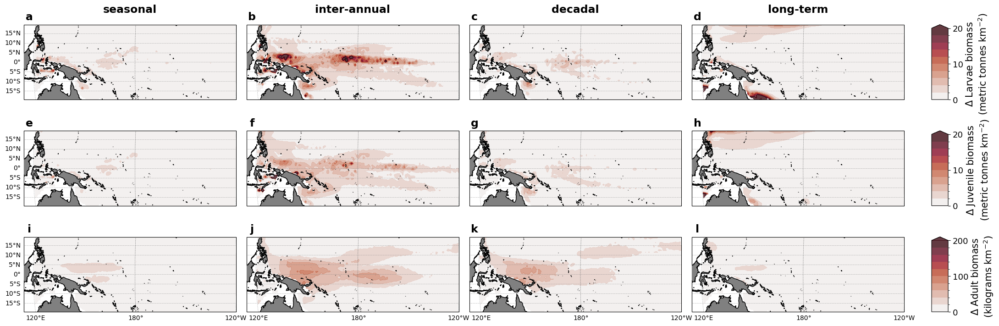

In [22]:
%%time

lons = ds_hf_larvae.coords['lon']
lats = ds_hf_larvae.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)
levs1 = np.arange(0,21,2)
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,21,2)
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,201,20)
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)

fig = plt.figure(figsize=(24,8))
gs = GridSpec(3,4)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[0,2], projection=proj)
ax4 = plt.subplot(gs[0,3], projection=proj)
ax5 = plt.subplot(gs[1,0], projection=proj)
ax6 = plt.subplot(gs[1,1], projection=proj)
ax7 = plt.subplot(gs[1,2], projection=proj)
ax8 = plt.subplot(gs[1,3], projection=proj)
ax9 = plt.subplot(gs[2,0], projection=proj)
ax10 = plt.subplot(gs[2,1], projection=proj)
ax11 = plt.subplot(gs[2,2], projection=proj)
ax12 = plt.subplot(gs[2,3], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'max'}
p1 = ax1.contourf(lons, lats, ds_hf_larvae['larvae_HF'].std(dim=['season_year','season']).T, **args1)
p2 = ax2.contourf(lons, lats, ds_mf_larvae['larvae_MF'].std(dim=['season_year','season']).T, **args1)
p3 = ax3.contourf(lons, lats, ds_lf_larvae['larvae_LF'].std(dim=['season_year','season']).T, **args1)
p4 = ax4.contourf(lons, lats, ds_tr_larvae['larvae_T'].mean(dim='season').std(dim=['season_year']).T, **args1)

args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'max'}
p5 = ax5.contourf(lons, lats, ds_hf_juvenile['juvenile_HF'].std(dim=['season_year','season']).T, **args2)
p6 = ax6.contourf(lons, lats, ds_mf_juvenile['juvenile_MF'].std(dim=['season_year','season']).T, **args2)
p7 = ax7.contourf(lons, lats, ds_lf_juvenile['juvenile_LF'].std(dim=['season_year','season']).T, **args2)
p8 = ax8.contourf(lons, lats, ds_tr_juvenile['juvenile_T'].mean(dim='season').std(dim=['season_year']).T, **args2)

args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'max'}
p9 = ax9.contourf(lons, lats, ds_hf_adult['adult_HF'].std(dim=['season_year','season']).T, **args3)
p10 = ax10.contourf(lons, lats, ds_mf_adult['adult_MF'].std(dim=['season_year','season']).T, **args3)
p11 = ax11.contourf(lons, lats, ds_lf_adult['adult_LF'].std(dim=['season_year','season']).T, **args3)
p12 = ax12.contourf(lons, lats, ds_tr_adult['adult_T'].mean(dim='season').std(dim=['season_year']).T, **args3)

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax7.add_feature(cfeature.LAND, color='grey', zorder=3)
ax7.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax8.add_feature(cfeature.LAND, color='grey', zorder=3)
ax8.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax9.add_feature(cfeature.LAND, color='grey', zorder=3)
ax9.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax10.add_feature(cfeature.LAND, color='grey', zorder=3)
ax10.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax11.add_feature(cfeature.LAND, color='grey', zorder=3)
ax11.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax12.add_feature(cfeature.LAND, color='grey', zorder=3)
ax12.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl7 = ax7.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl8 = ax8.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl9 = ax9.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl10 = ax10.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl11 = ax11.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl12 = ax12.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False; gl1.bottom_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.bottom_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False; gl3.bottom_labels = False; gl3.left_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.bottom_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False; gl5.bottom_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.bottom_labels = False; gl6.left_labels = False
gl7.top_labels = False; gl7.right_labels = False; gl7.bottom_labels = False; gl7.left_labels = False
gl8.top_labels = False; gl8.right_labels = False; gl8.bottom_labels = False; gl8.left_labels = False
gl9.top_labels = False; gl9.right_labels = False; 
gl10.top_labels = False; gl10.right_labels = False; gl10.left_labels = False
gl11.top_labels = False; gl11.right_labels = False; gl11.left_labels = False
gl12.top_labels = False; gl12.right_labels = False; gl12.left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"seasonal", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=ax1.transAxes)
plt.text(xx,yy,"inter-annual", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=ax2.transAxes)
plt.text(xx,yy,"decadal", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=ax3.transAxes)
plt.text(xx,yy,"long-term", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=ax4.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.025
ax4pos = ax4.get_position()
ax8pos = ax8.get_position()
ax12pos = ax12.get_position()
cbax1 = fig.add_axes([ax4pos.x1 + xx, ax4pos.y0, 0.015, ax4pos.y1 - ax4pos.y0])
cbax2 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax3 = fig.add_axes([ax12pos.x1 + xx, ax12pos.y0, 0.015, ax12pos.y1 - ax12pos.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Larvae biomass\n(metric tonnes km$^{-2}$)", fontsize=fslab)

cbar2 = plt.colorbar(p5, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Juvenile biomass\n(metric tonnes km$^{-2}$)", fontsize=fslab)

cbar3 = plt.colorbar(p9, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Adult biomass\n(kilograms km$^{-2}$)", fontsize=fslab)

xx = 0.025; yy = 1.1
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)
plt.text(xx,yy,"g", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax7.transAxes)
plt.text(xx,yy,"h", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax8.transAxes)
plt.text(xx,yy,"i", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax9.transAxes)
plt.text(xx,yy,"j", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax10.transAxes)
plt.text(xx,yy,"k", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax11.transAxes)
plt.text(xx,yy,"l", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax12.transAxes)

fig.savefig("./figures/BiomassSTDs_IMFs_fromGAM.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/BiomassSTDs_IMFs_fromGAM_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



#### NOTE!
##### We exclude the seasonal variation in the "trends" by taking the mean of the `season` dimension

### investigate the standard deviations of the predictors under the different climate frequencies

CPU times: user 41.3 s, sys: 5.69 s, total: 47 s
Wall time: 39.4 s


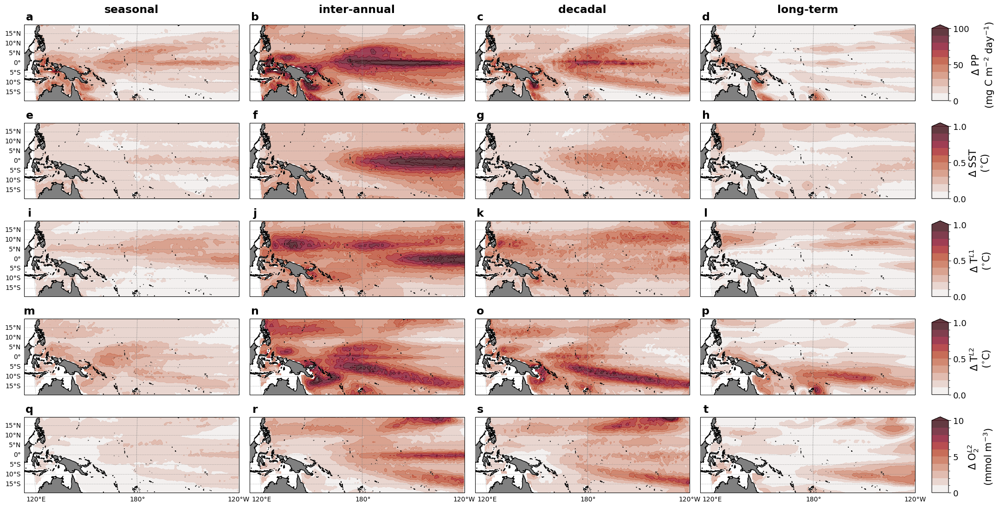

In [23]:
%%time

lons = ds_hf_larvae.coords['lon']
lats = ds_hf_larvae.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)
levs1 = np.arange(0,101,10)
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,21,2)*0.05
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,21,2)*0.05
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(0,21,2)*0.05
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(0,11,1)*1
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)

fig = plt.figure(figsize=(24,12))
gs = GridSpec(5,4)

axs = {}
plots = {}
grids = {}

for i in np.arange(5*4):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'max'}
args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'max'}
args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'max'}
args4 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm4, 'levels':levs4, 'extend':'max'}
args5 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm5, 'levels':levs5, 'extend':'max'}

for i in np.arange(5):
    n = i*4
    if i == 0:
        plots['p%i'%(n+0)] = axs['ax%i'%(n+0)].contourf(lons, lats, ds_hf_larvae['pp'].std(dim=['season_year','season']).T*12, **args1)
        plots['p%i'%(n+1)] = axs['ax%i'%(n+1)].contourf(lons, lats, ds_mf_larvae['pp'].std(dim=['season_year','season']).T*12, **args1)
        plots['p%i'%(n+2)] = axs['ax%i'%(n+2)].contourf(lons, lats, ds_lf_larvae['pp'].std(dim=['season_year','season']).T*12, **args1)
        plots['p%i'%(n+3)] = axs['ax%i'%(n+3)].contourf(lons, lats, ds_tr_larvae['pp'].mean(dim='season').std(dim=['season_year']).T*12, **args1)
    if i == 1:
        plots['p%i'%(n+0)] = axs['ax%i'%(n+0)].contourf(lons, lats, ds_hf_larvae['sst'].std(dim=['season_year','season']).T, **args2)
        plots['p%i'%(n+1)] = axs['ax%i'%(n+1)].contourf(lons, lats, ds_mf_larvae['sst'].std(dim=['season_year','season']).T, **args2)
        plots['p%i'%(n+2)] = axs['ax%i'%(n+2)].contourf(lons, lats, ds_lf_larvae['sst'].std(dim=['season_year','season']).T, **args2)
        plots['p%i'%(n+3)] = axs['ax%i'%(n+3)].contourf(lons, lats, ds_tr_larvae['sst'].mean(dim='season').std(dim=['season_year']).T, **args2)
    if i == 2:
        plots['p%i'%(n+0)] = axs['ax%i'%(n+0)].contourf(lons, lats, ds_hf_larvae['T_L1'].std(dim=['season_year','season']).T, **args3)
        plots['p%i'%(n+1)] = axs['ax%i'%(n+1)].contourf(lons, lats, ds_mf_larvae['T_L1'].std(dim=['season_year','season']).T, **args3)
        plots['p%i'%(n+2)] = axs['ax%i'%(n+2)].contourf(lons, lats, ds_lf_larvae['T_L1'].std(dim=['season_year','season']).T, **args3)
        plots['p%i'%(n+3)] = axs['ax%i'%(n+3)].contourf(lons, lats, ds_tr_larvae['T_L1'].mean(dim='season').std(dim=['season_year']).T, **args3)
    if i == 3:
        plots['p%i'%(n+0)] = axs['ax%i'%(n+0)].contourf(lons, lats, ds_hf_larvae['T_L2'].std(dim=['season_year','season']).T, **args4)
        plots['p%i'%(n+1)] = axs['ax%i'%(n+1)].contourf(lons, lats, ds_mf_larvae['T_L2'].std(dim=['season_year','season']).T, **args4)
        plots['p%i'%(n+2)] = axs['ax%i'%(n+2)].contourf(lons, lats, ds_lf_larvae['T_L2'].std(dim=['season_year','season']).T, **args4)
        plots['p%i'%(n+3)] = axs['ax%i'%(n+3)].contourf(lons, lats, ds_tr_larvae['T_L2'].mean(dim='season').std(dim=['season_year']).T, **args4)
    if i == 4:
        plots['p%i'%(n+0)] = axs['ax%i'%(n+0)].contourf(lons, lats, ds_hf_larvae['O2_L2'].std(dim=['season_year','season']).T*44.661, **args5)
        plots['p%i'%(n+1)] = axs['ax%i'%(n+1)].contourf(lons, lats, ds_mf_larvae['O2_L2'].std(dim=['season_year','season']).T*44.661, **args5)
        plots['p%i'%(n+2)] = axs['ax%i'%(n+2)].contourf(lons, lats, ds_lf_larvae['O2_L2'].std(dim=['season_year','season']).T*44.661, **args5)
        plots['p%i'%(n+3)] = axs['ax%i'%(n+3)].contourf(lons, lats, ds_tr_larvae['O2_L2'].mean(dim='season').std(dim=['season_year']).T*44.661, **args5)
    
        
for i in np.arange(4*5):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 16:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 3, 5, 6, 7, 9, 10, 11, 13, 14, 15, 17, 18, 19]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"seasonal", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"inter-annual", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"decadal", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)
plt.text(xx,yy,"long-term", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax3'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax3pos = axs['ax3'].get_position()
ax7pos = axs['ax7'].get_position()
ax11pos = axs['ax11'].get_position()
ax15pos = axs['ax15'].get_position()
ax19pos = axs['ax19'].get_position()
cbax1 = fig.add_axes([ax3pos.x1 + xx, ax3pos.y0, 0.015, ax3pos.y1 - ax3pos.y0])
cbax2 = fig.add_axes([ax7pos.x1 + xx, ax7pos.y0, 0.015, ax7pos.y1 - ax7pos.y0])
cbax3 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])
cbax4 = fig.add_axes([ax15pos.x1 + xx, ax15pos.y0, 0.015, ax15pos.y1 - ax15pos.y0])
cbax5 = fig.add_axes([ax19pos.x1 + xx, ax19pos.y0, 0.015, ax19pos.y1 - ax19pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ PP\n(mg C m$^{-2}$ day$^{-1}$)", fontsize=fslab)

cbar2 = plt.colorbar(plots['p4'], cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ SST\n($^{\circ}$C)", fontsize=fslab)

cbar3 = plt.colorbar(plots['p8'], cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ T$^{L1}$\n($^{\circ}$C)", fontsize=fslab)

cbar4 = plt.colorbar(plots['p12'], cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("$\Delta$ T$^{L2}$\n($^{\circ}$C)", fontsize=fslab)

cbar5 = plt.colorbar(plots['p16'], cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("$\Delta$ O$_{2}^{L2}$\n(mmol m$^{-3}$)", fontsize=fslab)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't']
for i in np.arange(4*5):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/indicatorSTDs_IMFs_fromGAM.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/indicatorSTDs_IMFs_fromGAM_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


### Linear trends of all 6 predictors

In [24]:
%%time

def linregress_1d(y, x):
    """
    y: 1D array of the variable
    x: 1D array of time (numeric)
    Returns: [slope, intercept, rvalue, pvalue, stderr]
    """
    y = np.asarray(y)
    x = np.asarray(x)

    mask = np.isfinite(y) & np.isfinite(x)
    if mask.sum() < 3:  # not enough data
        return np.array([np.nan, np.nan, np.nan, np.nan, np.nan])

    res = sci.stats.linregress(x[mask], y[mask])
    return np.array([res.slope, res.intercept, res.rvalue, res.pvalue, res.stderr])

time_years = ds_tr_larvae['season_year'].astype(float)


CPU times: user 837 μs, sys: 422 μs, total: 1.26 ms
Wall time: 1.27 ms


In [25]:
%%time

T_L1 = xr.apply_ufunc(
    linregress_1d,
    ds_tr_larvae['T_L1'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
sst = xr.apply_ufunc(
    linregress_1d,
    ds_tr_larvae['sst'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
O2_L2 = xr.apply_ufunc(
    linregress_1d,
    ds_tr_larvae['O2_L2'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
pp = xr.apply_ufunc(
    linregress_1d,
    ds_tr_larvae['pp'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
T_L2 = xr.apply_ufunc(
    linregress_1d,
    ds_tr_larvae['T_L2'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)

T_L1 = T_L1.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
sst = sst.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
O2_L2 = O2_L2.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
pp = pp.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
T_L2 = T_L2.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])

T_L1_slope = T_L1.sel(stat="slope")
T_L1_pvals = T_L1.sel(stat="p")
sst_slope = sst.sel(stat="slope")
sst_pvals = sst.sel(stat="p")
O2_L2_slope = O2_L2.sel(stat="slope")
O2_L2_pvals = O2_L2.sel(stat="p")
pp_slope = pp.sel(stat="slope")
pp_pvals = pp.sel(stat="p")
T_L2_slope = T_L2.sel(stat="slope")
T_L2_pvals = T_L2.sel(stat="p")



CPU times: user 7.79 s, sys: 1.31 s, total: 9.09 s
Wall time: 17.8 s


CPU times: user 13.6 s, sys: 1.78 s, total: 15.4 s
Wall time: 12.9 s


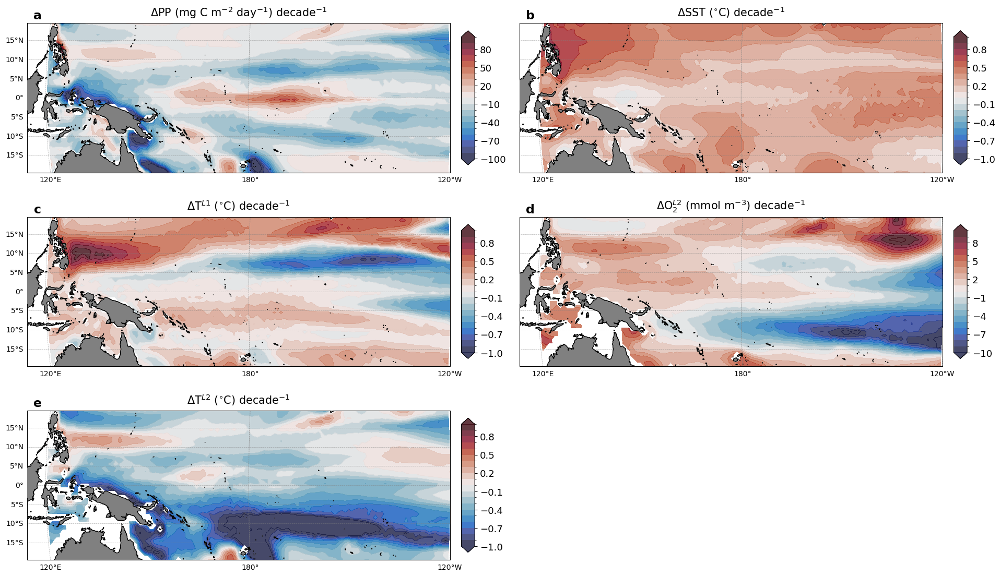

In [26]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,1)*10
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,1)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(-10,11,1)*0.1
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(-10,11,1)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(-10,11,1)*0.1
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)

p1 = ax1.contourf(lons, lats, pp_slope.T*12*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, sst_slope.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p3 = ax3.contourf(lons, lats, T_L1_slope.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='both')
p4 = ax4.contourf(lons, lats, O2_L2_slope.T*10*4*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='both')
p5 = ax5.contourf(lons, lats, T_L2_slope.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False

xx = 0.5; yy=1.075
plt.text(xx,yy,"$\Delta$PP (mg C m$^{-2}$ day$^{-1}$) decade$^{-1}$", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C) decade$^{-1}$", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C) decade$^{-1}$", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$) decade$^{-1}$", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C) decade$^{-1}$", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)


plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0.05, right=0.95, bottom=0.05, top=0.95)

cbar1 = plt.colorbar(p1, ax=ax1, orientation='vertical', ticks=levs1[::3], fraction=0.03, aspect=10, pad=0.025)
cbar2 = plt.colorbar(p2, ax=ax2, orientation='vertical', ticks=levs2[::3], fraction=0.03, aspect=10, pad=0.025)
cbar3 = plt.colorbar(p3, ax=ax3, orientation='vertical', ticks=levs3[::3], fraction=0.03, aspect=10, pad=0.025)
cbar4 = plt.colorbar(p4, ax=ax4, orientation='vertical', ticks=levs4[::3], fraction=0.03, aspect=10, pad=0.025)
cbar5 = plt.colorbar(p5, ax=ax5, orientation='vertical', ticks=levs5[::3], fraction=0.03, aspect=10, pad=0.025)

cbar1.ax.tick_params(labelsize=fstic)
cbar2.ax.tick_params(labelsize=fstic)
cbar3.ax.tick_params(labelsize=fstic)
cbar4.ax.tick_params(labelsize=fstic)
cbar5.ax.tick_params(labelsize=fstic)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)

fig.savefig("./figures/LinearTrends_Oceanography_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/LinearTrends_Oceanography_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



## Determine the correlation and effects of ENSO, IPO and CO2 on skipjack biomasses according to the GAMs
1. check how different the correlations and effects are in the GAM predictions versus the raw SEAPODYM output
2. then, with an understanding of the biases using the GAMs, explore how each predictor affects biomass under ENSO, IPO and CO2 forcing

#### convert the ENSO, IPO and CO2 timeseries to a similar format to the GAM output

CPU times: user 234 ms, sys: 22 ms, total: 256 ms
Wall time: 235 ms


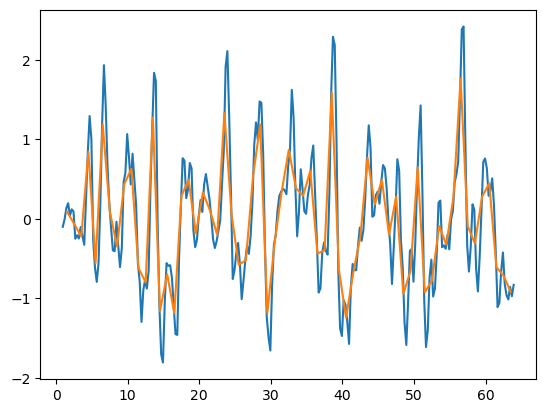

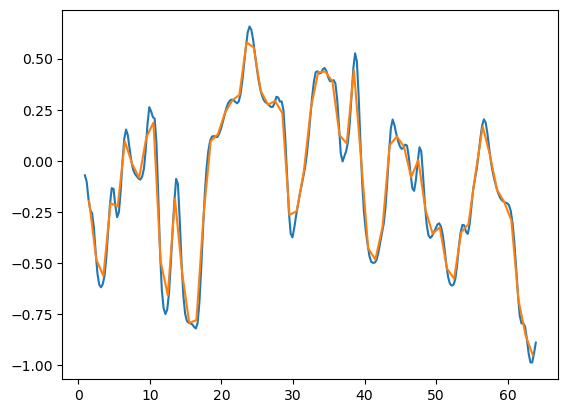

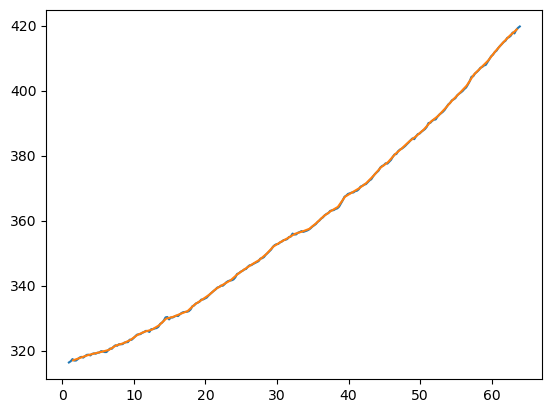

In [27]:
%%time

season_order = ['DJF', 'MAM', 'JJA', 'SON']

enso_for_corr_GAMs = enso_for_corr.sel(time=slice("1960-01-01","2022-12-31"))
ipo_for_corr_GAMs = ipo_for_corr.sel(time=slice("1960-01-01","2022-12-31"))
co2_for_corr_GAMs = co2_for_corr.sel(time=slice("1960-01-01","2022-12-31"))

enso_for_corr_GAMs = enso_for_corr_GAMs.assign_coords(
    season=('time', enso_for_corr_GAMs.time.dt.season.data),
    season_year=('time', enso_for_corr_GAMs.time.dt.year.data - 1959)
)
ipo_for_corr_GAMs = ipo_for_corr_GAMs.assign_coords(
    season=('time', ipo_for_corr_GAMs.time.dt.season.data),
    season_year=('time', ipo_for_corr_GAMs.time.dt.year.data - 1959)
)
co2_for_corr_GAMs = co2_for_corr_GAMs.assign_coords(
    season=('time', co2_for_corr_GAMs.time.dt.season.data),
    season_year=('time', co2_for_corr_GAMs.time.dt.year.data - 1959)
)

enso_grid = (enso_for_corr_GAMs.groupby(['season_year', 'season']).mean().reindex(season=season_order).transpose('season_year', 'season'))
ipo_grid = (ipo_for_corr_GAMs.groupby(['season_year', 'season']).mean().reindex(season=season_order).transpose('season_year', 'season'))
co2_grid = (co2_for_corr_GAMs.groupby(['season_year', 'season']).mean().reindex(season=season_order).transpose('season_year', 'season'))

### check that the conversion to the new grid was successful
time_decimal = (
    enso_for_corr.time.dt.year
    + (enso_for_corr.time.dt.month - 1) / 12
)

plt.figure()
plt.plot(time_decimal-1959, enso_for_corr)
plt.plot(enso_grid.coords['season_year']+0.5, enso_grid.mean(dim='season'))

plt.figure()
plt.plot(time_decimal-1959, ipo_for_corr)
plt.plot(ipo_grid.coords['season_year']+0.5, ipo_grid.mean(dim='season'))

plt.figure()
plt.plot(time_decimal-1959, co2_for_corr)
plt.plot(co2_grid.coords['season_year']+0.5, co2_grid.mean(dim='season'))

In [28]:
ds_mf_larvae

<xarray.Dataset> Size: 310MB
Dimensions:               (lon: 120, lat: 40, season_year: 63, season: 4)
Coordinates:
  * lon                   (lon) float64 960B 120.5 121.5 122.5 ... 238.5 239.5
  * lat                   (lat) float64 320B -19.5 -18.5 -17.5 ... 18.5 19.5
  * season_year           (season_year) int64 504B 1 2 3 4 5 ... 59 60 61 62 63
  * season                (season) object 32B 'DJF' 'JJA' 'MAM' 'SON'
Data variables: (12/32)
    pp                    (lon, lat, season_year, season) float64 10MB -4.249...
    sst                   (lon, lat, season_year, season) float64 10MB -0.052...
    T_L1                  (lon, lat, season_year, season) float64 10MB -0.158...
    T_L2                  (lon, lat, season_year, season) float64 10MB nan .....
    O2_L2                 (lon, lat, season_year, season) float64 10MB nan .....
    adultTF_MF            (lon, lat, season_year, season) float64 10MB nan .....
    ...                    ...
    larvae_MF             (lon, lat, season_year, season) float64 10MB nan .....
    larvae_MF_se          (lon, lat, season_year, season) float64 10MB nan .....
    larvae_T_L1           (lon, lat, season_year, season) float64 10MB nan .....
    larvae_sst            (lon, lat, season_year, season) float64 10MB nan .....
    larvae_O2_L2          (lon, lat, season_year, season) float64 10MB 0.0 .....
    larvae_pp             (lon, lat, season_year, season) float64 10MB nan .....

In [29]:
%%time

enso_larvae_corr_GAM = xr.corr(enso_grid, ds_mf_larvae['larvae_MF'], dim=['season_year', 'season'])
ipo_larvae_corr_GAM = xr.corr(ipo_grid, ds_lf_larvae['larvae_LF'], dim=['season_year', 'season'])
co2_larvae_corr_GAM = xr.corr(co2_grid, ds_tr_larvae['larvae_T'], dim=['season_year', 'season'])

enso_larvae_slope_GAM, enso_larvae_slope_se_GAM, enso_larvae_slope_r2_GAM = xr_slope_stats(ds_mf_larvae['larvae_MF'], enso_grid, dim=['season_year', 'season'])
ipo_larvae_slope_GAM, ipo_larvae_slope_se_GAM, ipo_larvae_slope_r2_GAM = xr_slope_stats(ds_lf_larvae['larvae_LF'], ipo_grid, dim=['season_year', 'season'])
co2_larvae_slope_GAM, co2_larvae_slope_se_GAM, co2_larvae_slope_r2_GAM = xr_slope_stats(ds_tr_larvae['larvae_T'], co2_grid, dim=['season_year', 'season'])

enso_juvenile_corr_GAM = xr.corr(enso_grid, ds_mf_juvenile['juvenile_MF'], dim=['season_year', 'season'])
ipo_juvenile_corr_GAM = xr.corr(ipo_grid, ds_lf_juvenile['juvenile_LF'], dim=['season_year', 'season'])
co2_juvenile_corr_GAM = xr.corr(co2_grid, ds_tr_juvenile['juvenile_T'], dim=['season_year', 'season'])

enso_juvenile_slope_GAM, enso_juvenile_slope_se_GAM, enso_juvenile_slope_r2_GAM = xr_slope_stats(ds_mf_juvenile['juvenile_MF'], enso_grid, dim=['season_year', 'season'])
ipo_juvenile_slope_GAM, ipo_juvenile_slope_se_GAM, ipo_juvenile_slope_r2_GAM = xr_slope_stats(ds_lf_juvenile['juvenile_LF'], ipo_grid, dim=['season_year', 'season'])
co2_juvenile_slope_GAM, co2_juvenile_slope_se_GAM, co2_juvenile_slope_r2_GAM = xr_slope_stats(ds_tr_juvenile['juvenile_T'], co2_grid, dim=['season_year', 'season'])

enso_adult_corr_GAM = xr.corr(enso_grid, ds_mf_adult['adult_MF'], dim=['season_year', 'season'])
ipo_adult_corr_GAM = xr.corr(ipo_grid, ds_lf_adult['adult_LF'], dim=['season_year', 'season'])
co2_adult_corr_GAM = xr.corr(co2_grid, ds_tr_adult['adult_T'], dim=['season_year', 'season'])

enso_adult_slope_GAM, enso_adult_slope_se_GAM, enso_adult_slope_r2_GAM = xr_slope_stats(ds_mf_adult['adult_MF'], enso_grid, dim=['season_year', 'season'])
ipo_adult_slope_GAM, ipo_adult_slope_se_GAM, ipo_adult_slope_r2_GAM = xr_slope_stats(ds_lf_adult['adult_LF'], ipo_grid, dim=['season_year', 'season'])
co2_adult_slope_GAM, co2_adult_slope_se_GAM, co2_adult_slope_r2_GAM = xr_slope_stats(ds_tr_adult['adult_T'], co2_grid, dim=['season_year', 'season'])

enso_larvae_pp_corr_GAM = xr.corr(enso_grid, ds_mf_larvae['larvae_pp'], dim=['season_year', 'season'])
enso_larvae_sst_corr_GAM = xr.corr(enso_grid, ds_mf_larvae['larvae_sst'], dim=['season_year', 'season'])
enso_larvae_T_L1_corr_GAM = xr.corr(enso_grid, ds_mf_larvae['larvae_T_L1'], dim=['season_year', 'season'])
enso_larvae_O2_L2_corr_GAM = xr.corr(enso_grid, ds_mf_larvae['larvae_O2_L2'], dim=['season_year', 'season'])
enso_juvenile_pp_corr_GAM = xr.corr(enso_grid, ds_mf_juvenile['juvenile_pp'], dim=['season_year', 'season'])
enso_juvenile_sst_corr_GAM = xr.corr(enso_grid, ds_mf_juvenile['juvenile_sst'], dim=['season_year', 'season'])
enso_juvenile_T_L1_corr_GAM = xr.corr(enso_grid, ds_mf_juvenile['juvenile_T_L1'], dim=['season_year', 'season'])
enso_juvenile_O2_L2_corr_GAM = xr.corr(enso_grid, ds_mf_juvenile['juvenile_O2_L2'], dim=['season_year', 'season'])
enso_adult_T_L1_corr_GAM = xr.corr(enso_grid, ds_mf_adult['adult_T_L1'], dim=['season_year', 'season'])
enso_adult_sst_corr_GAM = xr.corr(enso_grid, ds_mf_adult['adult_sst'], dim=['season_year', 'season'])
enso_adult_O2_L2_corr_GAM = xr.corr(enso_grid, ds_mf_adult['adult_O2_L2'], dim=['season_year', 'season'])
enso_adult_T_L2_corr_GAM = xr.corr(enso_grid, ds_mf_adult['adult_T_L2'], dim=['season_year', 'season'])

ipo_larvae_pp_corr_GAM = xr.corr(ipo_grid, ds_lf_larvae['larvae_pp'], dim=['season_year', 'season'])
ipo_larvae_sst_corr_GAM = xr.corr(ipo_grid, ds_lf_larvae['larvae_sst'], dim=['season_year', 'season'])
ipo_larvae_T_L1_corr_GAM = xr.corr(ipo_grid, ds_lf_larvae['larvae_T_L1'], dim=['season_year', 'season'])
ipo_larvae_O2_L2_corr_GAM = xr.corr(ipo_grid, ds_lf_larvae['larvae_O2_L2'], dim=['season_year', 'season'])
ipo_juvenile_pp_corr_GAM = xr.corr(ipo_grid, ds_lf_juvenile['juvenile_pp'], dim=['season_year', 'season'])
ipo_juvenile_sst_corr_GAM = xr.corr(ipo_grid, ds_lf_juvenile['juvenile_sst'], dim=['season_year', 'season'])
ipo_juvenile_T_L1_corr_GAM = xr.corr(ipo_grid, ds_lf_juvenile['juvenile_T_L1'], dim=['season_year', 'season'])
ipo_juvenile_O2_L2_corr_GAM = xr.corr(ipo_grid, ds_lf_juvenile['juvenile_O2_L2'], dim=['season_year', 'season'])
ipo_adult_T_L1_corr_GAM = xr.corr(ipo_grid, ds_lf_adult['adult_T_L1'], dim=['season_year', 'season'])
ipo_adult_sst_corr_GAM = xr.corr(ipo_grid, ds_lf_adult['adult_sst'], dim=['season_year', 'season'])
ipo_adult_O2_L2_corr_GAM = xr.corr(ipo_grid, ds_lf_adult['adult_O2_L2'], dim=['season_year', 'season'])
ipo_adult_T_L2_corr_GAM = xr.corr(ipo_grid, ds_lf_adult['adult_T_L2'], dim=['season_year', 'season'])

co2_larvae_pp_corr_GAM = xr.corr(co2_grid, ds_tr_larvae['larvae_pp'], dim=['season_year', 'season'])
co2_larvae_sst_corr_GAM = xr.corr(co2_grid, ds_tr_larvae['larvae_sst'], dim=['season_year', 'season'])
co2_larvae_T_L1_corr_GAM = xr.corr(co2_grid, ds_tr_larvae['larvae_T_L1'], dim=['season_year', 'season'])
co2_larvae_O2_L2_corr_GAM = xr.corr(co2_grid, ds_tr_larvae['larvae_O2_L2'], dim=['season_year', 'season'])
co2_juvenile_pp_corr_GAM = xr.corr(co2_grid, ds_tr_juvenile['juvenile_pp'], dim=['season_year', 'season'])
co2_juvenile_sst_corr_GAM = xr.corr(co2_grid, ds_tr_juvenile['juvenile_sst'], dim=['season_year', 'season'])
co2_juvenile_T_L1_corr_GAM = xr.corr(co2_grid, ds_tr_juvenile['juvenile_T_L1'], dim=['season_year', 'season'])
co2_juvenile_O2_L2_corr_GAM = xr.corr(co2_grid, ds_tr_juvenile['juvenile_O2_L2'], dim=['season_year', 'season'])
co2_adult_T_L1_corr_GAM = xr.corr(co2_grid, ds_tr_adult['adult_T_L1'], dim=['season_year', 'season'])
co2_adult_sst_corr_GAM = xr.corr(co2_grid, ds_tr_adult['adult_sst'], dim=['season_year', 'season'])
co2_adult_O2_L2_corr_GAM = xr.corr(co2_grid, ds_tr_adult['adult_O2_L2'], dim=['season_year', 'season'])
co2_adult_T_L2_corr_GAM = xr.corr(co2_grid, ds_tr_adult['adult_T_L2'], dim=['season_year', 'season'])

enso_larvae_pp_slope_GAM, enso_larvae_pp_slope_se_GAM, enso_larvae_pp_slope_r2_GAM = xr_slope_stats(ds_mf_larvae['larvae_pp'], enso_grid, dim=['season_year', 'season'])
enso_larvae_sst_slope_GAM, enso_larvae_sst_slope_se_GAM, enso_larvae_sst_slope_r2_GAM = xr_slope_stats(ds_mf_larvae['larvae_sst'], enso_grid, dim=['season_year', 'season'])
enso_larvae_T_L1_slope_GAM, enso_larvae_T_L1_slope_se_GAM, enso_larvae_T_L1_slope_r2_GAM = xr_slope_stats(ds_mf_larvae['larvae_T_L1'], enso_grid, dim=['season_year', 'season'])
enso_larvae_O2_L2_slope_GAM, enso_larvae_O2_L2_slope_se_GAM, enso_larvae_O2_L2_slope_r2_GAM = xr_slope_stats(ds_mf_larvae['larvae_O2_L2'], enso_grid, dim=['season_year', 'season'])
enso_juvenile_pp_slope_GAM, enso_juvenile_pp_slope_se_GAM, enso_juvenile_pp_slope_r2_GAM = xr_slope_stats(ds_mf_juvenile['juvenile_pp'], enso_grid, dim=['season_year', 'season'])
enso_juvenile_sst_slope_GAM, enso_juvenile_sst_slope_se_GAM, enso_juvenile_sst_slope_r2_GAM = xr_slope_stats(ds_mf_juvenile['juvenile_sst'], enso_grid, dim=['season_year', 'season'])
enso_juvenile_T_L1_slope_GAM, enso_juvenile_T_L1_slope_se_GAM, enso_juvenile_T_L1_slope_r2_GAM = xr_slope_stats(ds_mf_juvenile['juvenile_T_L1'], enso_grid, dim=['season_year', 'season'])
enso_juvenile_O2_L2_slope_GAM, enso_juvenile_O2_L2_slope_se_GAM, enso_juvenile_O2_L2_slope_r2_GAM = xr_slope_stats(ds_mf_juvenile['juvenile_O2_L2'], enso_grid, dim=['season_year', 'season'])
enso_adult_T_L1_slope_GAM, enso_adult_T_L1_slope_se_GAM, enso_adult_T_L1_slope_r2_GAM = xr_slope_stats(ds_mf_adult['adult_T_L1'], enso_grid, dim=['season_year', 'season'])
enso_adult_sst_slope_GAM, enso_adult_sst_slope_se_GAM, enso_adult_sst_slope_r2_GAM = xr_slope_stats(ds_mf_adult['adult_sst'], enso_grid, dim=['season_year', 'season'])
enso_adult_O2_L2_slope_GAM, enso_adult_O2_L2_slope_se_GAM, enso_adult_O2_L2_slope_r2_GAM = xr_slope_stats(ds_mf_adult['adult_O2_L2'], enso_grid, dim=['season_year', 'season'])
enso_adult_T_L2_slope_GAM, enso_adult_T_L2_slope_se_GAM, enso_adult_T_L2_slope_r2_GAM = xr_slope_stats(ds_mf_adult['adult_T_L2'], enso_grid, dim=['season_year', 'season'])

ipo_larvae_pp_slope_GAM, ipo_larvae_pp_slope_se_GAM, ipo_larvae_pp_slope_r2_GAM = xr_slope_stats(ds_lf_larvae['larvae_pp'], ipo_grid, dim=['season_year', 'season'])
ipo_larvae_sst_slope_GAM, ipo_larvae_sst_slope_se_GAM, ipo_larvae_sst_slope_r2_GAM = xr_slope_stats(ds_lf_larvae['larvae_sst'], ipo_grid, dim=['season_year', 'season'])
ipo_larvae_T_L1_slope_GAM, ipo_larvae_T_L1_slope_se_GAM, ipo_larvae_T_L1_slope_r2_GAM = xr_slope_stats(ds_lf_larvae['larvae_T_L1'], ipo_grid, dim=['season_year', 'season'])
ipo_larvae_O2_L2_slope_GAM, ipo_larvae_O2_L2_slope_se_GAM, ipo_larvae_O2_L2_slope_r2_GAM = xr_slope_stats(ds_lf_larvae['larvae_O2_L2'], ipo_grid, dim=['season_year', 'season'])
ipo_juvenile_pp_slope_GAM, ipo_juvenile_pp_slope_se_GAM, ipo_juvenile_pp_slope_r2_GAM = xr_slope_stats(ds_lf_juvenile['juvenile_pp'], ipo_grid, dim=['season_year', 'season'])
ipo_juvenile_sst_slope_GAM, ipo_juvenile_sst_slope_se_GAM, ipo_juvenile_sst_slope_r2_GAM = xr_slope_stats(ds_lf_juvenile['juvenile_sst'], ipo_grid, dim=['season_year', 'season'])
ipo_juvenile_T_L1_slope_GAM, ipo_juvenile_T_L1_slope_se_GAM, ipo_juvenile_T_L1_slope_r2_GAM = xr_slope_stats(ds_lf_juvenile['juvenile_T_L1'], ipo_grid, dim=['season_year', 'season'])
ipo_juvenile_O2_L2_slope_GAM, ipo_juvenile_O2_L2_slope_se_GAM, ipo_juvenile_O2_L2_slope_r2_GAM = xr_slope_stats(ds_lf_juvenile['juvenile_O2_L2'], ipo_grid, dim=['season_year', 'season'])
ipo_adult_T_L1_slope_GAM, ipo_adult_T_L1_slope_se_GAM, ipo_adult_T_L1_slope_r2_GAM = xr_slope_stats(ds_lf_adult['adult_T_L1'], ipo_grid, dim=['season_year', 'season'])
ipo_adult_sst_slope_GAM, ipo_adult_sst_slope_se_GAM, ipo_adult_sst_slope_r2_GAM = xr_slope_stats(ds_lf_adult['adult_sst'], ipo_grid, dim=['season_year', 'season'])
ipo_adult_O2_L2_slope_GAM, ipo_adult_O2_L2_slope_se_GAM, ipo_adult_O2_L2_slope_r2_GAM = xr_slope_stats(ds_lf_adult['adult_O2_L2'], ipo_grid, dim=['season_year', 'season'])
ipo_adult_T_L2_slope_GAM, ipo_adult_T_L2_slope_se_GAM, ipo_adult_T_L2_slope_r2_GAM = xr_slope_stats(ds_lf_adult['adult_T_L2'], ipo_grid, dim=['season_year', 'season'])

co2_larvae_pp_slope_GAM, co2_larvae_pp_slope_se_GAM, co2_larvae_pp_slope_r2_GAM = xr_slope_stats(ds_tr_larvae['larvae_pp'], co2_grid, dim=['season_year', 'season'])
co2_larvae_sst_slope_GAM, co2_larvae_sst_slope_se_GAM, co2_larvae_sst_slope_r2_GAM = xr_slope_stats(ds_tr_larvae['larvae_sst'], co2_grid, dim=['season_year', 'season'])
co2_larvae_T_L1_slope_GAM, co2_larvae_T_L1_slope_se_GAM, co2_larvae_T_L1_slope_r2_GAM = xr_slope_stats(ds_tr_larvae['larvae_T_L1'], co2_grid, dim=['season_year', 'season'])
co2_larvae_O2_L2_slope_GAM, co2_larvae_O2_L2_slope_se_GAM, co2_larvae_O2_L2_slope_r2_GAM = xr_slope_stats(ds_tr_larvae['larvae_O2_L2'], co2_grid, dim=['season_year', 'season'])
co2_juvenile_pp_slope_GAM, co2_juvenile_pp_slope_se_GAM, co2_juvenile_pp_slope_r2_GAM = xr_slope_stats(ds_tr_juvenile['juvenile_pp'], co2_grid, dim=['season_year', 'season'])
co2_juvenile_sst_slope_GAM, co2_juvenile_sst_slope_se_GAM, co2_juvenile_sst_slope_r2_GAM = xr_slope_stats(ds_tr_juvenile['juvenile_sst'], co2_grid, dim=['season_year', 'season'])
co2_juvenile_T_L1_slope_GAM, co2_juvenile_T_L1_slope_se_GAM, co2_juvenile_T_L1_slope_r2_GAM = xr_slope_stats(ds_tr_juvenile['juvenile_T_L1'], co2_grid, dim=['season_year', 'season'])
co2_juvenile_O2_L2_slope_GAM, co2_juvenile_O2_L2_slope_se_GAM, co2_juvenile_O2_L2_slope_r2_GAM = xr_slope_stats(ds_tr_juvenile['juvenile_O2_L2'], co2_grid, dim=['season_year', 'season'])
co2_adult_T_L1_slope_GAM, co2_adult_T_L1_slope_se_GAM, co2_adult_T_L1_slope_r2_GAM = xr_slope_stats(ds_tr_adult['adult_T_L1'], co2_grid, dim=['season_year', 'season'])
co2_adult_sst_slope_GAM, co2_adult_sst_slope_se_GAM, co2_adult_sst_slope_r2_GAM = xr_slope_stats(ds_tr_adult['adult_sst'], co2_grid, dim=['season_year', 'season'])
co2_adult_O2_L2_slope_GAM, co2_adult_O2_L2_slope_se_GAM, co2_adult_O2_L2_slope_r2_GAM = xr_slope_stats(ds_tr_adult['adult_O2_L2'], co2_grid, dim=['season_year', 'season'])
co2_adult_T_L2_slope_GAM, co2_adult_T_L2_slope_se_GAM, co2_adult_T_L2_slope_r2_GAM = xr_slope_stats(ds_tr_adult['adult_T_L2'], co2_grid, dim=['season_year', 'season'])

CPU times: user 7.31 s, sys: 363 ms, total: 7.67 s
Wall time: 6.09 s


CPU times: user 19.8 s, sys: 2.64 s, total: 22.5 s
Wall time: 18.8 s


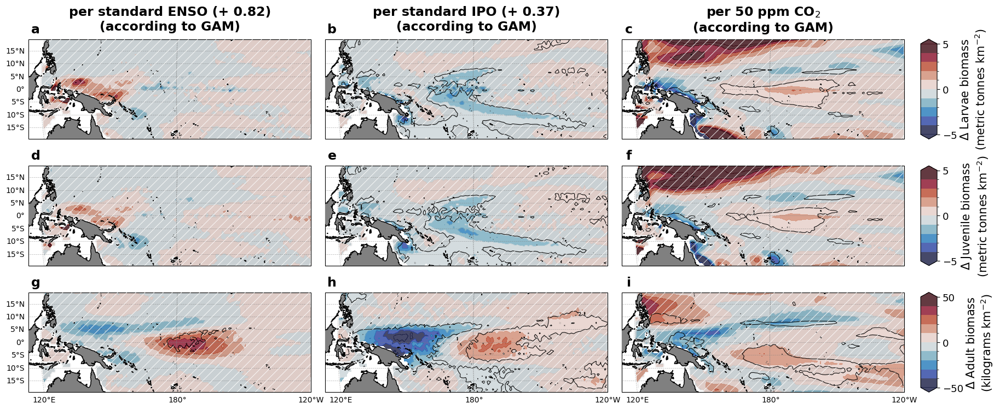

In [30]:
%%time

lons = enso_larvae_slope_GAM.coords['lon']
lats = enso_larvae_slope_GAM.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-10,11,2)*0.5
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,2)*0.5
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(-100,101,20)*0.5
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)

fig = plt.figure(figsize=(20,8))
gs = GridSpec(3,3)

axs = {}
plots = {}
conts = {}
grids = {}

for i in np.arange(3*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'both'}
args3 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm3, 'levels':levs3, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}
argsH = {'transform':ccrs.PlateCarree(), 'levels': [0.5, 1.5], 'colors': 'none', 'hatches': ['//'], 'zorder':10, "alpha":0.05}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_larvae_slope_GAM.T * enso_std.values, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_slope_GAM.T * ipo_std.values, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_larvae_slope_GAM.T * 50, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_juvenile_slope_GAM.T * enso_std.values, **args2)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_juvenile_slope_GAM.T * ipo_std.values, **args2)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_juvenile_slope_GAM.T * 50, **args2)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_adult_slope_GAM.T * enso_std.values, **args3)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_adult_slope_GAM.T * ipo_std.values, **args3)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_adult_slope_GAM.T * 50, **args3)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_larvae_slope_r2_GAM.T, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_larvae_slope_r2_GAM.T, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_larvae_slope_r2_GAM.T, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_juvenile_slope_r2_GAM.T, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_juvenile_slope_r2_GAM.T, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_juvenile_slope_r2_GAM.T, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_adult_slope_r2_GAM.T, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_adult_slope_r2_GAM.T, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_adult_slope_r2_GAM.T, **argsC)

plots['h0'] = axs['ax0'].contourf(lons, lats, enso_larvae_slope_r2_GAM.T < 0.3, **argsH)
plots['h1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_slope_r2_GAM.T < 0.3, **argsH)
plots['h2'] = axs['ax2'].contourf(lons, lats, co2_larvae_slope_r2_GAM.T < 0.3, **argsH)

plots['h3'] = axs['ax3'].contourf(lons, lats, enso_juvenile_slope_r2_GAM.T < 0.3, **argsH)
plots['h4'] = axs['ax4'].contourf(lons, lats, ipo_juvenile_slope_r2_GAM.T < 0.3, **argsH)
plots['h5'] = axs['ax5'].contourf(lons, lats, co2_juvenile_slope_r2_GAM.T < 0.3, **argsH)

plots['h6'] = axs['ax6'].contourf(lons, lats, enso_adult_slope_r2_GAM.T < 0.3, **argsH)
plots['h7'] = axs['ax7'].contourf(lons, lats, ipo_adult_slope_r2_GAM.T < 0.3, **argsH)
plots['h8'] = axs['ax8'].contourf(lons, lats, co2_adult_slope_r2_GAM.T < 0.3, **argsH)


for i in np.arange(3*3):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 6:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)\n(according to GAM)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)\n(according to GAM)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$\n(according to GAM)", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Larvae biomass\n(metric tonnes km$^{-2}$)", fontsize=fslab)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Juvenile biomass\n(metric tonnes km$^{-2}$)", fontsize=fslab)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Adult biomass\n(kilograms km$^{-2}$)", fontsize=fslab)


xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']
for i in np.arange(3*3):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/Biomass_effectsizes_GAM_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/Biomass_effectsizes_GAM_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 25.3 s, sys: 3.54 s, total: 28.9 s
Wall time: 24.2 s


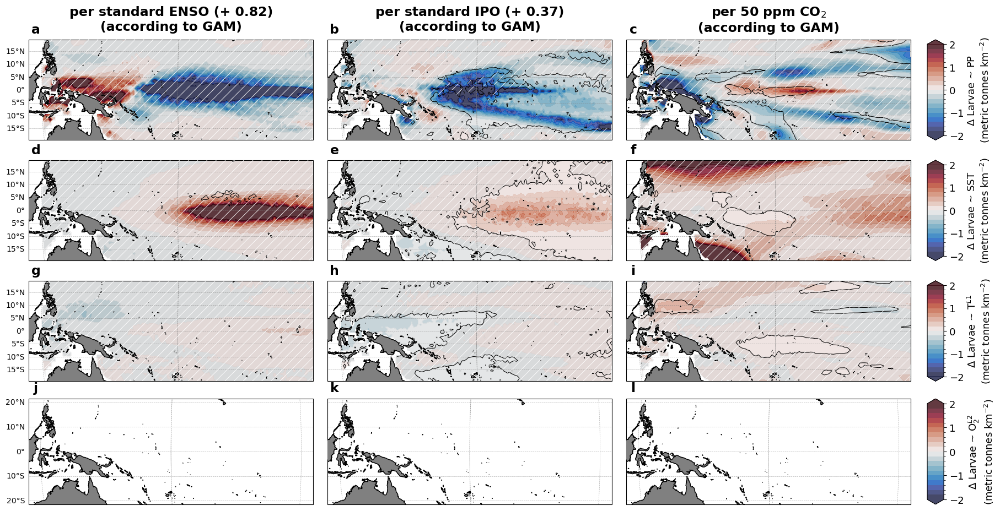

In [31]:
%%time

lons = enso_larvae_pp_slope_GAM.coords['lon']
lats = enso_larvae_pp_slope_GAM.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-10,11,1)*0.2
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(20,10))
gs = GridSpec(4,3)

axs = {}
plots = {}
grids = {}

for i in np.arange(4*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}
argsH = {'transform':ccrs.PlateCarree(), 'levels': [0.5, 1.5], 'colors': 'none', 'hatches': ['//'], 'zorder':10, "alpha":0.05}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_larvae_pp_slope_GAM.T * enso_std.values, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_pp_slope_GAM.T * ipo_std.values, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_larvae_pp_slope_GAM.T * 50, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_larvae_sst_slope_GAM.T * enso_std.values, **args1)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_larvae_sst_slope_GAM.T * ipo_std.values, **args1)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_larvae_sst_slope_GAM.T * 50, **args1)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_larvae_T_L1_slope_GAM.T * enso_std.values, **args1)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_larvae_T_L1_slope_GAM.T * ipo_std.values, **args1)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_larvae_T_L1_slope_GAM.T * 50, **args1)

plots['p9'] = axs['ax9'].contourf(lons, lats, enso_larvae_O2_L2_slope_GAM.T * enso_std.values, **args1)
plots['p10'] = axs['ax10'].contourf(lons, lats, ipo_larvae_O2_L2_slope_GAM.T * ipo_std.values, **args1)
plots['p11'] = axs['ax11'].contourf(lons, lats, co2_larvae_O2_L2_slope_GAM.T * 50, **args1)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_larvae_pp_slope_r2_GAM.T, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_larvae_pp_slope_r2_GAM.T, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_larvae_pp_slope_r2_GAM.T, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_larvae_sst_slope_r2_GAM.T, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_larvae_sst_slope_r2_GAM.T, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_larvae_sst_slope_r2_GAM.T, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_larvae_T_L1_slope_r2_GAM.T, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_larvae_T_L1_slope_r2_GAM.T, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_larvae_T_L1_slope_r2_GAM.T, **argsC)

plots['c9'] = axs['ax9'].contour(lons, lats, enso_larvae_O2_L2_slope_r2_GAM.T, **argsC)
plots['c10'] = axs['ax10'].contour(lons, lats, ipo_larvae_O2_L2_slope_r2_GAM.T, **argsC)
plots['c11'] = axs['ax11'].contour(lons, lats, co2_larvae_O2_L2_slope_r2_GAM.T, **argsC)

plots['h0'] = axs['ax0'].contourf(lons, lats, enso_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h2'] = axs['ax2'].contourf(lons, lats, co2_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)

plots['h3'] = axs['ax3'].contourf(lons, lats, enso_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h4'] = axs['ax4'].contourf(lons, lats, ipo_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h5'] = axs['ax5'].contourf(lons, lats, co2_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)

plots['h6'] = axs['ax6'].contourf(lons, lats, enso_larvae_T_L1_slope_r2_GAM.T < 0.3, **argsH)
plots['h7'] = axs['ax7'].contourf(lons, lats, ipo_larvae_T_L1_slope_r2_GAM.T < 0.3, **argsH)
plots['h8'] = axs['ax8'].contourf(lons, lats, co2_larvae_T_L1_slope_r2_GAM.T < 0.3, **argsH)

plots['h9'] = axs['ax9'].contourf(lons, lats, enso_larvae_O2_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h10'] = axs['ax10'].contourf(lons, lats, ipo_larvae_O2_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h11'] = axs['ax11'].contourf(lons, lats, co2_larvae_O2_L2_slope_r2_GAM.T < 0.3, **argsH)

for i in np.arange(3*4):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 12:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8, 10, 11, 13, 14]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)\n(according to GAM)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)\n(according to GAM)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$\n(according to GAM)", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
ax11pos = axs['ax11'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax4 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Larvae ~ PP\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs1[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Larvae ~ SST\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs1[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Larvae ~ T$^{L1}$\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar4 = plt.colorbar(plots['p9'], cax=cbax4, orientation='vertical', ticks=levs1[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("$\Delta$ Larvae ~ O$_2^{L2}$\n(metric tonnes km$^{-2}$)", fontsize=fstic)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l']
for i in np.arange(3*4):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/Larvae_indicators_effectsizes_GAM_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/Larvae_indicators_effectsizes_GAM_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


CPU times: user 24.9 s, sys: 3.48 s, total: 28.4 s
Wall time: 23.8 s


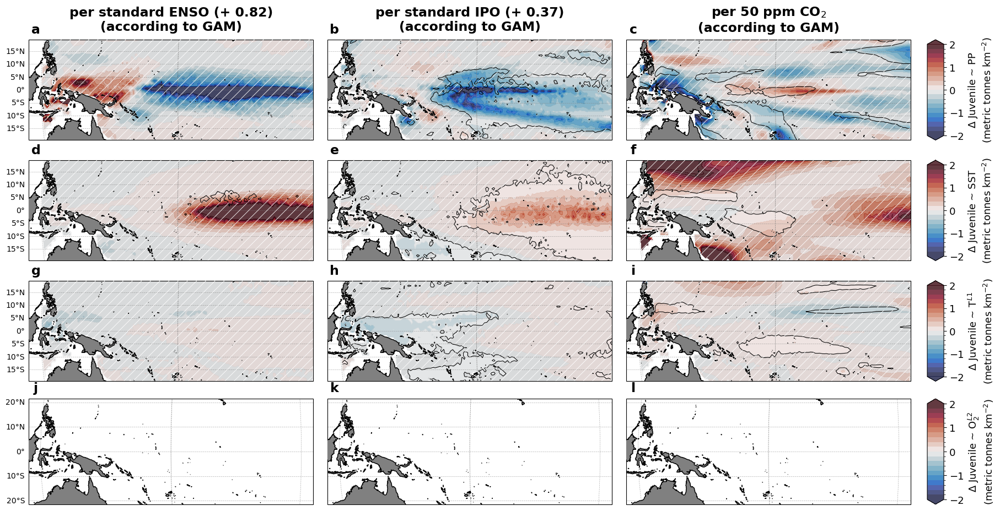

In [32]:
%%time

lons = enso_larvae_pp_slope_GAM.coords['lon']
lats = enso_larvae_pp_slope_GAM.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-10,11,1)*0.2
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(20,10))
gs = GridSpec(4,3)

axs = {}
plots = {}
grids = {}

for i in np.arange(4*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}
argsH = {'transform':ccrs.PlateCarree(), 'levels': [0.5, 1.5], 'colors': 'none', 'hatches': ['//'], 'zorder':10, "alpha":0.05}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_juvenile_pp_slope_GAM.T * enso_std.values, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_juvenile_pp_slope_GAM.T * ipo_std.values, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_juvenile_pp_slope_GAM.T * 50, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_juvenile_sst_slope_GAM.T * enso_std.values, **args1)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_juvenile_sst_slope_GAM.T * ipo_std.values, **args1)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_juvenile_sst_slope_GAM.T * 50, **args1)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_juvenile_T_L1_slope_GAM.T * enso_std.values, **args1)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_juvenile_T_L1_slope_GAM.T * ipo_std.values, **args1)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_juvenile_T_L1_slope_GAM.T * 50, **args1)

plots['p9'] = axs['ax9'].contourf(lons, lats, enso_juvenile_O2_L2_slope_GAM.T * enso_std.values, **args1)
plots['p10'] = axs['ax10'].contourf(lons, lats, ipo_juvenile_O2_L2_slope_GAM.T * ipo_std.values, **args1)
plots['p11'] = axs['ax11'].contourf(lons, lats, co2_juvenile_O2_L2_slope_GAM.T * 50, **args1)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_juvenile_pp_slope_r2_GAM.T, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_juvenile_pp_slope_r2_GAM.T, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_juvenile_pp_slope_r2_GAM.T, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_juvenile_sst_slope_r2_GAM.T, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_juvenile_sst_slope_r2_GAM.T, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_juvenile_sst_slope_r2_GAM.T, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_juvenile_T_L1_slope_r2_GAM.T, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_juvenile_T_L1_slope_r2_GAM.T, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_juvenile_T_L1_slope_r2_GAM.T, **argsC)

plots['c9'] = axs['ax9'].contour(lons, lats, enso_juvenile_O2_L2_slope_r2_GAM.T, **argsC)
plots['c10'] = axs['ax10'].contour(lons, lats, ipo_juvenile_O2_L2_slope_r2_GAM.T, **argsC)
plots['c11'] = axs['ax11'].contour(lons, lats, co2_juvenile_O2_L2_slope_r2_GAM.T, **argsC)

plots['h0'] = axs['ax0'].contourf(lons, lats, enso_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h1'] = axs['ax1'].contourf(lons, lats, ipo_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h2'] = axs['ax2'].contourf(lons, lats, co2_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)

plots['h3'] = axs['ax3'].contourf(lons, lats, enso_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h4'] = axs['ax4'].contourf(lons, lats, ipo_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h5'] = axs['ax5'].contourf(lons, lats, co2_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)

plots['h6'] = axs['ax6'].contourf(lons, lats, enso_juvenile_T_L1_slope_r2_GAM.T < 0.3, **argsH)
plots['h7'] = axs['ax7'].contourf(lons, lats, ipo_juvenile_T_L1_slope_r2_GAM.T < 0.3, **argsH)
plots['h8'] = axs['ax8'].contourf(lons, lats, co2_juvenile_T_L1_slope_r2_GAM.T < 0.3, **argsH)

plots['h9'] = axs['ax9'].contourf(lons, lats, enso_juvenile_O2_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h10'] = axs['ax10'].contourf(lons, lats, ipo_juvenile_O2_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h11'] = axs['ax11'].contourf(lons, lats, co2_juvenile_O2_L2_slope_r2_GAM.T < 0.3, **argsH)

for i in np.arange(3*4):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 12:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8, 10, 11, 13, 14]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)\n(according to GAM)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)\n(according to GAM)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$\n(according to GAM)", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
ax11pos = axs['ax11'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax4 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Juvenile ~ PP\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs1[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Juvenile ~ SST\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs1[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Juvenile ~ T$^{L1}$\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar4 = plt.colorbar(plots['p9'], cax=cbax4, orientation='vertical', ticks=levs1[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("$\Delta$ Juvenile ~ O$_2^{L2}$\n(metric tonnes km$^{-2}$)", fontsize=fstic)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l']
for i in np.arange(3*4):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/Juvenile_indicators_effectsizes_GAM_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/Juvenile_indicators_effectsizes_GAM_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


In [ ]:
%%time

lons = enso_larvae_pp_slope_GAM.coords['lon']
lats = enso_larvae_pp_slope_GAM.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-10,11,1)*0.2
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(20,10))
gs = GridSpec(4,3)

axs = {}
plots = {}
grids = {}

for i in np.arange(4*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}
argsH = {'transform':ccrs.PlateCarree(), 'levels': [0.5, 1.5], 'colors': 'none', 'hatches': ['//'], 'zorder':10, "alpha":0.05}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_larvae_pp_slope_GAM.T * enso_std.values, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_pp_slope_GAM.T * ipo_std.values, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_larvae_pp_slope_GAM.T * 50, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_larvae_sst_slope_GAM.T * enso_std.values, **args1)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_larvae_sst_slope_GAM.T * ipo_std.values, **args1)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_larvae_sst_slope_GAM.T * 50, **args1)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_juvenile_pp_slope_GAM.T * enso_std.values, **args1)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_juvenile_pp_slope_GAM.T * ipo_std.values, **args1)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_juvenile_pp_slope_GAM.T * 50, **args1)

plots['p9'] = axs['ax9'].contourf(lons, lats, enso_juvenile_sst_slope_GAM.T * enso_std.values, **args1)
plots['p10'] = axs['ax10'].contourf(lons, lats, ipo_juvenile_sst_slope_GAM.T * ipo_std.values, **args1)
plots['p11'] = axs['ax11'].contourf(lons, lats, co2_juvenile_sst_slope_GAM.T * 50, **args1)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_larvae_pp_slope_r2_GAM.T, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_larvae_pp_slope_r2_GAM.T, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_larvae_pp_slope_r2_GAM.T, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_larvae_sst_slope_r2_GAM.T, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_larvae_sst_slope_r2_GAM.T, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_larvae_sst_slope_r2_GAM.T, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_juvenile_pp_slope_r2_GAM.T, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_juvenile_pp_slope_r2_GAM.T, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_juvenile_pp_slope_r2_GAM.T, **argsC)

plots['c9'] = axs['ax9'].contour(lons, lats, enso_juvenile_sst_slope_r2_GAM.T, **argsC)
plots['c10'] = axs['ax10'].contour(lons, lats, ipo_juvenile_sst_slope_r2_GAM.T, **argsC)
plots['c11'] = axs['ax11'].contour(lons, lats, co2_juvenile_sst_slope_r2_GAM.T, **argsC)

plots['h0'] = axs['ax0'].contourf(lons, lats, enso_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h2'] = axs['ax2'].contourf(lons, lats, co2_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)

plots['h3'] = axs['ax3'].contourf(lons, lats, enso_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h4'] = axs['ax4'].contourf(lons, lats, ipo_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h5'] = axs['ax5'].contourf(lons, lats, co2_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)

plots['h6'] = axs['ax6'].contourf(lons, lats, enso_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h7'] = axs['ax7'].contourf(lons, lats, ipo_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h8'] = axs['ax8'].contourf(lons, lats, co2_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)

plots['h9'] = axs['ax9'].contourf(lons, lats, enso_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h10'] = axs['ax10'].contourf(lons, lats, ipo_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h11'] = axs['ax11'].contourf(lons, lats, co2_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)


for i in np.arange(3*4):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 12:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8, 10, 11, 13, 14]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)\n(according to GAM)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)\n(according to GAM)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$\n(according to GAM)", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
ax11pos = axs['ax11'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax4 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Larvae ~ PP\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs1[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Larvae ~ SST\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs1[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Juvenile ~ PP\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar4 = plt.colorbar(plots['p9'], cax=cbax4, orientation='vertical', ticks=levs1[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("$\Delta$ Juvenile ~ SST\n(metric tonnes km$^{-2}$)", fontsize=fstic)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l']
for i in np.arange(3*4):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/LarvaeAndJuvenile_indicators_effectsizes_GAM_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/LarvaeAndJuvenile_indicators_effectsizes_GAM_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


CPU times: user 28.1 s, sys: 3.99 s, total: 32.1 s
Wall time: 26.9 s


CPU times: user 28 s, sys: 4.01 s, total: 32 s
Wall time: 26.8 s


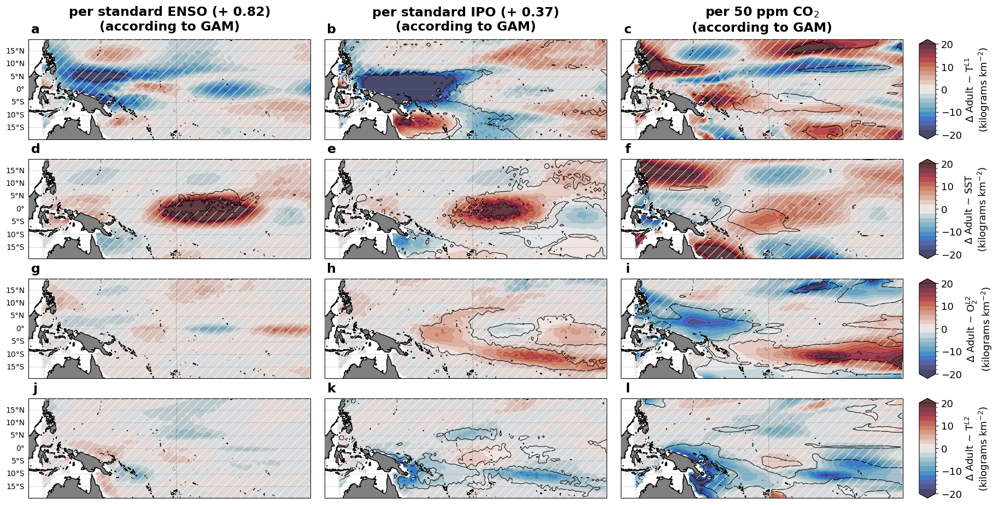

In [34]:
%%time

lons = enso_larvae_pp_slope_GAM.coords['lon']
lats = enso_larvae_pp_slope_GAM.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-10,11,1)*2
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(20,10))
gs = GridSpec(4,3)

axs = {}
plots = {}
grids = {}

for i in np.arange(4*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}
argsH = {'transform':ccrs.PlateCarree(), 'levels': [0.5, 1.5], 'colors': 'none', 'hatches': ['//'], 'zorder':10, "alpha":0.05}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_adult_T_L1_slope_GAM.T * enso_std.values, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_adult_T_L1_slope_GAM.T * ipo_std.values, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_adult_T_L1_slope_GAM.T * 50, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_adult_sst_slope_GAM.T * enso_std.values, **args1)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_adult_sst_slope_GAM.T * ipo_std.values, **args1)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_adult_sst_slope_GAM.T * 50, **args1)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_adult_O2_L2_slope_GAM.T * enso_std.values, **args1)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_adult_O2_L2_slope_GAM.T * ipo_std.values, **args1)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_adult_O2_L2_slope_GAM.T * 50, **args1)

plots['p9'] = axs['ax9'].contourf(lons, lats, enso_adult_T_L2_slope_GAM.T * enso_std.values, **args1)
plots['p10'] = axs['ax10'].contourf(lons, lats, ipo_adult_T_L2_slope_GAM.T * ipo_std.values, **args1)
plots['p11'] = axs['ax11'].contourf(lons, lats, co2_adult_T_L2_slope_GAM.T * 50, **args1)

plots['c0'] = axs['ax0'].contour(lons, lats, enso_adult_T_L1_slope_r2_GAM.T, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_adult_T_L1_slope_r2_GAM.T, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_adult_T_L1_slope_r2_GAM.T, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_adult_sst_slope_r2_GAM.T, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_adult_sst_slope_r2_GAM.T, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_adult_sst_slope_r2_GAM.T, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_adult_O2_L2_slope_r2_GAM.T, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_adult_O2_L2_slope_r2_GAM.T, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_adult_O2_L2_slope_r2_GAM.T, **argsC)

plots['c9'] = axs['ax9'].contour(lons, lats, enso_adult_T_L2_slope_r2_GAM.T, **argsC)
plots['c10'] = axs['ax10'].contour(lons, lats, ipo_adult_T_L2_slope_r2_GAM.T, **argsC)
plots['c11'] = axs['ax11'].contour(lons, lats, co2_adult_T_L2_slope_r2_GAM.T, **argsC)

plots['h0'] = axs['ax0'].contourf(lons, lats, enso_adult_T_L1_slope_r2_GAM.T < 0.3, **argsH)
plots['h1'] = axs['ax1'].contourf(lons, lats, ipo_adult_T_L1_slope_r2_GAM.T < 0.3, **argsH)
plots['h2'] = axs['ax2'].contourf(lons, lats, co2_adult_T_L1_slope_r2_GAM.T < 0.3, **argsH)

plots['h3'] = axs['ax3'].contourf(lons, lats, enso_adult_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h4'] = axs['ax4'].contourf(lons, lats, ipo_adult_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h5'] = axs['ax5'].contourf(lons, lats, co2_adult_sst_slope_r2_GAM.T < 0.3, **argsH)

plots['h6'] = axs['ax6'].contourf(lons, lats, enso_adult_O2_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h7'] = axs['ax7'].contourf(lons, lats, ipo_adult_O2_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h8'] = axs['ax8'].contourf(lons, lats, co2_adult_O2_L2_slope_r2_GAM.T < 0.3, **argsH)

plots['h9'] = axs['ax9'].contourf(lons, lats, enso_adult_T_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h10'] = axs['ax10'].contourf(lons, lats, ipo_adult_T_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h11'] = axs['ax11'].contourf(lons, lats, co2_adult_T_L2_slope_r2_GAM.T < 0.3, **argsH)

for i in np.arange(3*4):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 12:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8, 10, 11, 13, 14]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)\n(according to GAM)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)\n(according to GAM)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$\n(according to GAM)", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
ax11pos = axs['ax11'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax4 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Adult ~ T$^{L1}$\n(kilograms km$^{-2}$)", fontsize=fstic)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs1[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Adult ~ SST\n(kilograms km$^{-2}$)", fontsize=fstic)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs1[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Adult ~ O$_2^{L2}$\n(kilograms km$^{-2}$)", fontsize=fstic)

cbar4 = plt.colorbar(plots['p9'], cax=cbax4, orientation='vertical', ticks=levs1[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("$\Delta$ Adult ~ T$^{L2}$\n(kilograms km$^{-2}$)", fontsize=fstic)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l']
for i in np.arange(3*4):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/Adult_indicators_effectsizes_GAM_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/Adult_indicators_effectsizes_GAM_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


CPU times: user 55.4 s, sys: 7.88 s, total: 1min 3s
Wall time: 53.1 s


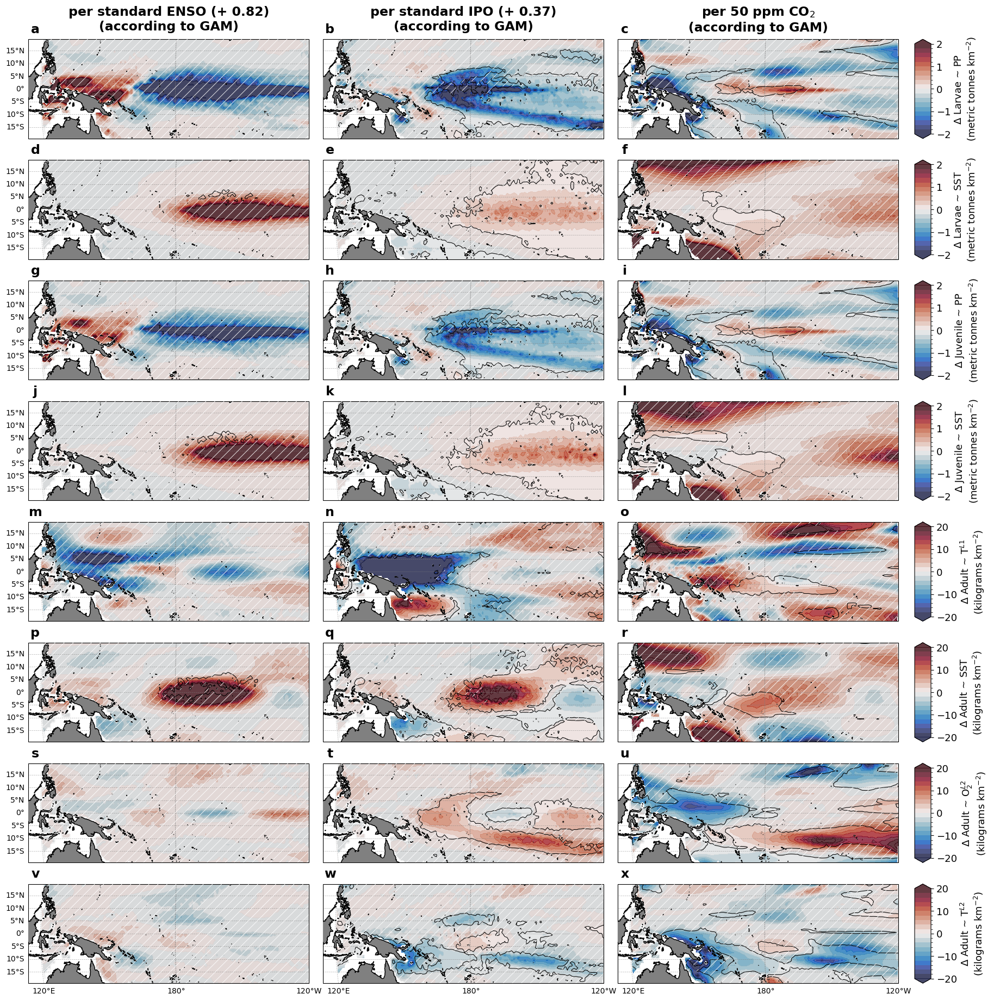

In [43]:
%%time

lons = enso_larvae_pp_slope_GAM.coords['lon']
lats = enso_larvae_pp_slope_GAM.coords['lat']

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-10,11,1)*0.2
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,1)*2
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)

fig = plt.figure(figsize=(20,20))
gs = GridSpec(8,3)

axs = {}
plots = {}
grids = {}

for i in np.arange(8*3):
    axs['ax%i'%(i)] = plt.subplot(gs[i], projection=proj)

args1 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm1, 'levels':levs1, 'extend':'both'}
args2 = {'transform':ccrs.PlateCarree(), 'cmap':colmap, 'norm':norm2, 'levels':levs2, 'extend':'both'}
argsC = {'transform':ccrs.PlateCarree(), 'colors':'k', 'levels':[0.3], 'linewidths':0.75}
argsH = {'transform':ccrs.PlateCarree(), 'levels': [0.5, 1.5], 'colors': 'none', 'hatches': ['//'], 'zorder':10, "alpha":0.05}

plots['p0'] = axs['ax0'].contourf(lons, lats, enso_larvae_pp_slope_GAM.T * enso_std.values, **args1)
plots['p1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_pp_slope_GAM.T * ipo_std.values, **args1)
plots['p2'] = axs['ax2'].contourf(lons, lats, co2_larvae_pp_slope_GAM.T * 50, **args1)

plots['p3'] = axs['ax3'].contourf(lons, lats, enso_larvae_sst_slope_GAM.T * enso_std.values, **args1)
plots['p4'] = axs['ax4'].contourf(lons, lats, ipo_larvae_sst_slope_GAM.T * ipo_std.values, **args1)
plots['p5'] = axs['ax5'].contourf(lons, lats, co2_larvae_sst_slope_GAM.T * 50, **args1)

plots['p6'] = axs['ax6'].contourf(lons, lats, enso_juvenile_pp_slope_GAM.T * enso_std.values, **args1)
plots['p7'] = axs['ax7'].contourf(lons, lats, ipo_juvenile_pp_slope_GAM.T * ipo_std.values, **args1)
plots['p8'] = axs['ax8'].contourf(lons, lats, co2_juvenile_pp_slope_GAM.T * 50, **args1)

plots['p9'] = axs['ax9'].contourf(lons, lats, enso_juvenile_sst_slope_GAM.T * enso_std.values, **args1)
plots['p10'] = axs['ax10'].contourf(lons, lats, ipo_juvenile_sst_slope_GAM.T * ipo_std.values, **args1)
plots['p11'] = axs['ax11'].contourf(lons, lats, co2_juvenile_sst_slope_GAM.T * 50, **args1)

plots['p12'] = axs['ax12'].contourf(lons, lats, enso_adult_T_L1_slope_GAM.T * enso_std.values, **args2)
plots['p13'] = axs['ax13'].contourf(lons, lats, ipo_adult_T_L1_slope_GAM.T * ipo_std.values, **args2)
plots['p14'] = axs['ax14'].contourf(lons, lats, co2_adult_T_L1_slope_GAM.T * 50, **args2)

plots['p15'] = axs['ax15'].contourf(lons, lats, enso_adult_sst_slope_GAM.T * enso_std.values, **args2)
plots['p16'] = axs['ax16'].contourf(lons, lats, ipo_adult_sst_slope_GAM.T * ipo_std.values, **args2)
plots['p17'] = axs['ax17'].contourf(lons, lats, co2_adult_sst_slope_GAM.T * 50, **args2)

plots['p18'] = axs['ax18'].contourf(lons, lats, enso_adult_O2_L2_slope_GAM.T * enso_std.values, **args2)
plots['p19'] = axs['ax19'].contourf(lons, lats, ipo_adult_O2_L2_slope_GAM.T * ipo_std.values, **args2)
plots['p20'] = axs['ax20'].contourf(lons, lats, co2_adult_O2_L2_slope_GAM.T * 50, **args2)

plots['p21'] = axs['ax21'].contourf(lons, lats, enso_adult_T_L2_slope_GAM.T * enso_std.values, **args2)
plots['p22'] = axs['ax22'].contourf(lons, lats, ipo_adult_T_L2_slope_GAM.T * ipo_std.values, **args2)
plots['p23'] = axs['ax23'].contourf(lons, lats, co2_adult_T_L2_slope_GAM.T * 50, **args2)


plots['c0'] = axs['ax0'].contour(lons, lats, enso_larvae_pp_slope_r2_GAM.T, **argsC)
plots['c1'] = axs['ax1'].contour(lons, lats, ipo_larvae_pp_slope_r2_GAM.T, **argsC)
plots['c2'] = axs['ax2'].contour(lons, lats, co2_larvae_pp_slope_r2_GAM.T, **argsC)

plots['c3'] = axs['ax3'].contour(lons, lats, enso_larvae_sst_slope_r2_GAM.T, **argsC)
plots['c4'] = axs['ax4'].contour(lons, lats, ipo_larvae_sst_slope_r2_GAM.T, **argsC)
plots['c5'] = axs['ax5'].contour(lons, lats, co2_larvae_sst_slope_r2_GAM.T, **argsC)

plots['c6'] = axs['ax6'].contour(lons, lats, enso_juvenile_pp_slope_r2_GAM.T, **argsC)
plots['c7'] = axs['ax7'].contour(lons, lats, ipo_juvenile_pp_slope_r2_GAM.T, **argsC)
plots['c8'] = axs['ax8'].contour(lons, lats, co2_juvenile_pp_slope_r2_GAM.T, **argsC)

plots['c9'] = axs['ax9'].contour(lons, lats, enso_juvenile_sst_slope_r2_GAM.T, **argsC)
plots['c10'] = axs['ax10'].contour(lons, lats, ipo_juvenile_sst_slope_r2_GAM.T, **argsC)
plots['c11'] = axs['ax11'].contour(lons, lats, co2_juvenile_sst_slope_r2_GAM.T, **argsC)

plots['c12'] = axs['ax12'].contour(lons, lats, enso_adult_T_L1_slope_r2_GAM.T, **argsC)
plots['c13'] = axs['ax13'].contour(lons, lats, ipo_adult_T_L1_slope_r2_GAM.T, **argsC)
plots['c14'] = axs['ax14'].contour(lons, lats, co2_adult_T_L1_slope_r2_GAM.T, **argsC)

plots['c15'] = axs['ax15'].contour(lons, lats, enso_adult_sst_slope_r2_GAM.T, **argsC)
plots['c16'] = axs['ax16'].contour(lons, lats, ipo_adult_sst_slope_r2_GAM.T, **argsC)
plots['c17'] = axs['ax17'].contour(lons, lats, co2_adult_sst_slope_r2_GAM.T, **argsC)

plots['c18'] = axs['ax18'].contour(lons, lats, enso_adult_O2_L2_slope_r2_GAM.T, **argsC)
plots['c19'] = axs['ax19'].contour(lons, lats, ipo_adult_O2_L2_slope_r2_GAM.T, **argsC)
plots['c20'] = axs['ax20'].contour(lons, lats, co2_adult_O2_L2_slope_r2_GAM.T, **argsC)

plots['c21'] = axs['ax21'].contour(lons, lats, enso_adult_T_L2_slope_r2_GAM.T, **argsC)
plots['c22'] = axs['ax22'].contour(lons, lats, ipo_adult_T_L2_slope_r2_GAM.T, **argsC)
plots['c23'] = axs['ax23'].contour(lons, lats, co2_adult_T_L2_slope_r2_GAM.T, **argsC)

plots['h0'] = axs['ax0'].contourf(lons, lats, enso_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h1'] = axs['ax1'].contourf(lons, lats, ipo_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h2'] = axs['ax2'].contourf(lons, lats, co2_larvae_pp_slope_r2_GAM.T < 0.3, **argsH)

plots['h3'] = axs['ax3'].contourf(lons, lats, enso_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h4'] = axs['ax4'].contourf(lons, lats, ipo_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h5'] = axs['ax5'].contourf(lons, lats, co2_larvae_sst_slope_r2_GAM.T < 0.3, **argsH)

plots['h6'] = axs['ax6'].contourf(lons, lats, enso_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h7'] = axs['ax7'].contourf(lons, lats, ipo_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)
plots['h8'] = axs['ax8'].contourf(lons, lats, co2_juvenile_pp_slope_r2_GAM.T < 0.3, **argsH)

plots['h9'] = axs['ax9'].contourf(lons, lats, enso_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h10'] = axs['ax10'].contourf(lons, lats, ipo_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h11'] = axs['ax11'].contourf(lons, lats, co2_juvenile_sst_slope_r2_GAM.T < 0.3, **argsH)

plots['h12'] = axs['ax12'].contourf(lons, lats, enso_adult_T_L1_slope_r2_GAM.T < 0.3, **argsH)
plots['h13'] = axs['ax13'].contourf(lons, lats, ipo_adult_T_L1_slope_r2_GAM.T < 0.3, **argsH)
plots['h14'] = axs['ax14'].contourf(lons, lats, co2_adult_T_L1_slope_r2_GAM.T < 0.3, **argsH)

plots['h15'] = axs['ax15'].contourf(lons, lats, enso_adult_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h16'] = axs['ax16'].contourf(lons, lats, ipo_adult_sst_slope_r2_GAM.T < 0.3, **argsH)
plots['h17'] = axs['ax17'].contourf(lons, lats, co2_adult_sst_slope_r2_GAM.T < 0.3, **argsH)

plots['h18'] = axs['ax18'].contourf(lons, lats, enso_adult_O2_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h19'] = axs['ax19'].contourf(lons, lats, ipo_adult_O2_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h20'] = axs['ax20'].contourf(lons, lats, co2_adult_O2_L2_slope_r2_GAM.T < 0.3, **argsH)

plots['h21'] = axs['ax21'].contourf(lons, lats, enso_adult_T_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h22'] = axs['ax22'].contourf(lons, lats, ipo_adult_T_L2_slope_r2_GAM.T < 0.3, **argsH)
plots['h23'] = axs['ax23'].contourf(lons, lats, co2_adult_T_L2_slope_r2_GAM.T < 0.3, **argsH)

for i in np.arange(3*8):
    axs['ax%i'%(i)].add_feature(cfeature.LAND, color='grey', zorder=3)
    axs['ax%i'%(i)].add_feature(cfeature.COASTLINE, color='k', zorder=4)
    grids['gl%i'%(i)] = axs['ax%i'%(i)].gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
    grids['gl%i'%(i)].top_labels = False 
    grids['gl%i'%(i)].right_labels = False
    if i < 21:
        grids['gl%i'%(i)].bottom_labels = False
    if i in [1, 2, 4, 5, 7, 8, 10, 11, 13, 14, 16, 17, 19, 20, 22, 23]:
        grids['gl%i'%(i)].left_labels = False

xx = 0.5; yy=1.2

plt.text(xx,yy,"per standard ENSO (+ %.2f)\n(according to GAM)"%(enso_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax0'].transAxes)
plt.text(xx,yy,"per standard IPO (+ %.2f)\n(according to GAM)"%(ipo_std.values), fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax1'].transAxes)
plt.text(xx,yy,"per 50 ppm CO$_2$\n(according to GAM)", fontsize=fslab+2, ha='center', va='center', fontweight='bold', transform=axs['ax2'].transAxes)

plt.subplots_adjust(wspace=0.05, hspace=-0.1, left=0.05, right=0.85, bottom=0.05, top=0.95)

xx = 0.015
ax2pos = axs['ax2'].get_position()
ax5pos = axs['ax5'].get_position()
ax8pos = axs['ax8'].get_position()
ax11pos = axs['ax11'].get_position()
ax14pos = axs['ax14'].get_position()
ax17pos = axs['ax17'].get_position()
ax20pos = axs['ax20'].get_position()
ax23pos = axs['ax23'].get_position()
cbax1 = fig.add_axes([ax2pos.x1 + xx, ax2pos.y0, 0.015, ax2pos.y1 - ax2pos.y0])
cbax2 = fig.add_axes([ax5pos.x1 + xx, ax5pos.y0, 0.015, ax5pos.y1 - ax5pos.y0])
cbax3 = fig.add_axes([ax8pos.x1 + xx, ax8pos.y0, 0.015, ax8pos.y1 - ax8pos.y0])
cbax4 = fig.add_axes([ax11pos.x1 + xx, ax11pos.y0, 0.015, ax11pos.y1 - ax11pos.y0])
cbax5 = fig.add_axes([ax14pos.x1 + xx, ax14pos.y0, 0.015, ax14pos.y1 - ax14pos.y0])
cbax6 = fig.add_axes([ax17pos.x1 + xx, ax17pos.y0, 0.015, ax17pos.y1 - ax17pos.y0])
cbax7 = fig.add_axes([ax20pos.x1 + xx, ax20pos.y0, 0.015, ax20pos.y1 - ax20pos.y0])
cbax8 = fig.add_axes([ax23pos.x1 + xx, ax23pos.y0, 0.015, ax23pos.y1 - ax23pos.y0])

cbar1 = plt.colorbar(plots['p0'], cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Larvae ~ PP\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar2 = plt.colorbar(plots['p3'], cax=cbax2, orientation='vertical', ticks=levs1[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Larvae ~ SST\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar3 = plt.colorbar(plots['p6'], cax=cbax3, orientation='vertical', ticks=levs1[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("$\Delta$ Juvenile ~ PP\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar4 = plt.colorbar(plots['p9'], cax=cbax4, orientation='vertical', ticks=levs1[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("$\Delta$ Juvenile ~ SST\n(metric tonnes km$^{-2}$)", fontsize=fstic)

cbar5 = plt.colorbar(plots['p12'], cax=cbax5, orientation='vertical', ticks=levs2[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("$\Delta$ Adult ~ T$^{L1}$\n(kilograms km$^{-2}$)", fontsize=fstic)

cbar6 = plt.colorbar(plots['p15'], cax=cbax6, orientation='vertical', ticks=levs2[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("$\Delta$ Adult ~ SST\n(kilograms km$^{-2}$)", fontsize=fstic)

cbar7 = plt.colorbar(plots['p18'], cax=cbax7, orientation='vertical', ticks=levs2[::5])
cbar7.ax.tick_params(labelsize=fstic)
cbar7.ax.set_ylabel("$\Delta$ Adult ~ O$_2^{L2}$\n(kilograms km$^{-2}$)", fontsize=fstic)

cbar8 = plt.colorbar(plots['p21'], cax=cbax8, orientation='vertical', ticks=levs2[::5])
cbar8.ax.tick_params(labelsize=fstic)
cbar8.ax.set_ylabel("$\Delta$ Adult ~ T$^{L2}$\n(kilograms km$^{-2}$)", fontsize=fstic)

xx = 0.025; yy = 1.1
labs = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l',
        'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x']
for i in np.arange(3*8):
    plt.text(xx,yy,labs[i], fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=axs['ax%i'%(i)].transAxes)

fig.savefig("./figures/All_indicators_effectsizes_GAM_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/All_indicators_effectsizes_GAM_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


In [35]:
print(enso_for_corr.std().values)
print(ipo_for_corr.std().values)

0.8222014492850639
0.37408847469352613


#### plot the integrated stock changes in biomass under ENSO, IPO and CO2 forcing

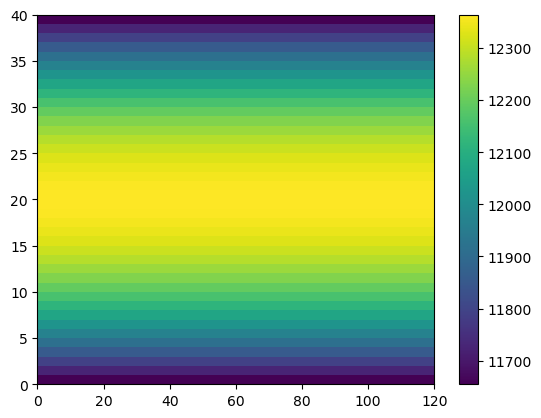

In [36]:
def grid_cell_area(lat, lon, radius=6371000.0):
    """
    Calculate exact spherical grid-cell areas from 1D cell-centre coordinates.

    Returns
    -------
    xarray.DataArray
        Grid-cell area in m2, with dimensions (lat, lon).
    """

    def centres_to_edges(values):
        values = np.asarray(values, dtype=float)

        if values.ndim != 1 or values.size < 2:
            raise ValueError("Coordinates must be one-dimensional with at least two values.")

        midpoints = 0.5 * (values[:-1] + values[1:])

        edges = np.empty(values.size + 1)
        edges[1:-1] = midpoints
        edges[0] = values[0] - (midpoints[0] - values[0])
        edges[-1] = values[-1] + (values[-1] - midpoints[-1])

        return edges

    lat_edges = np.deg2rad(centres_to_edges(lat.values))
    lon_edges = np.deg2rad(centres_to_edges(lon.values))

    area = (
        radius**2
        * np.abs(np.sin(lat_edges[1:]) - np.sin(lat_edges[:-1]))[:, None]
        * np.abs(lon_edges[1:] - lon_edges[:-1])[None, :]
    )

    return xr.DataArray(
        area,
        dims=("lat", "lon"),
        coords={"lat": lat, "lon": lon},
        name="grid_cell_area",
        attrs={"units": "m2"},
    )

grid = grid_cell_area(lats, lons)

plt.figure()
plt.pcolormesh(grid*1e-6); plt.colorbar()

#### Sum the biomass slopes and SEs in the domain

In [37]:
%%time

### larvae ###
enso_larvae_sum = (enso_larvae_slope * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
enso_larvae_sum_pse = ((enso_larvae_slope + enso_larvae_slope_se * 1.96) * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
enso_larvae_sum_nse = ((enso_larvae_slope - enso_larvae_slope_se * 1.96) * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])

ipo_larvae_sum = (ipo_larvae_slope * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
ipo_larvae_sum_pse = ((ipo_larvae_slope + ipo_larvae_slope_se * 1.96) * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
ipo_larvae_sum_nse = ((ipo_larvae_slope - ipo_larvae_slope_se * 1.96) * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])

co2_larvae_sum = (co2_larvae_slope * grid * 1e-6).sum(dim=['lon', 'lat'])
co2_larvae_sum_pse = ((co2_larvae_slope + co2_larvae_slope_se * 1.96) * grid * 1e-6).sum(dim=['lon', 'lat'])
co2_larvae_sum_nse = ((co2_larvae_slope - co2_larvae_slope_se * 1.96) * grid * 1e-6).sum(dim=['lon', 'lat'])


### juvenile ###
enso_juvenile_sum = (enso_juvenile_slope * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
enso_juvenile_sum_pse = ((enso_juvenile_slope + enso_juvenile_slope_se * 1.96) * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
enso_juvenile_sum_nse = ((enso_juvenile_slope - enso_juvenile_slope_se * 1.96) * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])

ipo_juvenile_sum = (ipo_juvenile_slope * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
ipo_juvenile_sum_pse = ((ipo_juvenile_slope + ipo_juvenile_slope_se * 1.96) * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
ipo_juvenile_sum_nse = ((ipo_juvenile_slope - ipo_juvenile_slope_se * 1.96) * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])

co2_juvenile_sum = (co2_juvenile_slope * grid * 1e-6).sum(dim=['lon', 'lat'])
co2_juvenile_sum_pse = ((co2_juvenile_slope + co2_juvenile_slope_se * 1.96) * grid * 1e-6).sum(dim=['lon', 'lat'])
co2_juvenile_sum_nse = ((co2_juvenile_slope - co2_juvenile_slope_se * 1.96) * grid * 1e-6).sum(dim=['lon', 'lat'])


### adult ###
enso_adult_sum = (enso_adult_slope * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
enso_adult_sum_pse = ((enso_adult_slope + enso_adult_slope_se * 1.96) * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
enso_adult_sum_nse = ((enso_adult_slope - enso_adult_slope_se * 1.96) * enso_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])

ipo_adult_sum = (ipo_adult_slope * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
ipo_adult_sum_pse = ((ipo_adult_slope + ipo_adult_slope_se * 1.96) * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])
ipo_adult_sum_nse = ((ipo_adult_slope - ipo_adult_slope_se * 1.96) * ipo_std.values * grid * 1e-6).sum(dim=['lon', 'lat'])

co2_adult_sum = (co2_adult_slope * grid * 1e-6).sum(dim=['lon', 'lat'])
co2_adult_sum_pse = ((co2_adult_slope + co2_adult_slope_se * 1.96) * grid * 1e-6).sum(dim=['lon', 'lat'])
co2_adult_sum_nse = ((co2_adult_slope - co2_adult_slope_se * 1.96) * grid * 1e-6).sum(dim=['lon', 'lat'])



CPU times: user 52.5 ms, sys: 10.2 ms, total: 62.7 ms
Wall time: 55.8 ms


#### this time, sum the biomass then regress against the indices to get the SE

In [38]:
%%time

### Larvae ###
res = xr_slope_stats((larvae_seasonal['larvae_imfs'].sel(IMF=2) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     enso_for_corr, dim=['time'])
enso_larvae_net_slope, enso_larvae_net_slope_se, enso_larvae_net_slope_r2 = res

res = xr_slope_stats((larvae_seasonal['larvae_imfs'].sel(IMF=3) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     ipo_for_corr, dim=['time'])
ipo_larvae_net_slope, ipo_larvae_net_slope_se, ipo_larvae_net_slope_r2 = res

res = xr_slope_stats(((larvae_seasonal['larvae_imfs'].sel(IMF=4) + larvae_seasonal['larvae_trend3D']) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     co2_for_corr, dim=['time'])
co2_larvae_net_slope, co2_larvae_net_slope_se, co2_larvae_net_slope_r2 = res


### Juvenile ###
res = xr_slope_stats((juvenile_seasonal['juvenile_imfs'].sel(IMF=2) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     enso_for_corr, dim=['time'])
enso_juvenile_net_slope, enso_juvenile_net_slope_se, enso_juvenile_net_slope_r2 = res

res = xr_slope_stats((juvenile_seasonal['juvenile_imfs'].sel(IMF=3) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     ipo_for_corr, dim=['time'])
ipo_juvenile_net_slope, ipo_juvenile_net_slope_se, ipo_juvenile_net_slope_r2 = res

res = xr_slope_stats(((juvenile_seasonal['juvenile_imfs'].sel(IMF=4) + juvenile_seasonal['juvenile_trend3D']) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     co2_for_corr, dim=['time'])
co2_juvenile_net_slope, co2_juvenile_net_slope_se, co2_juvenile_net_slope_r2 = res


### Adult ###
res = xr_slope_stats((adult_seasonal['adult_imfs'].sel(IMF=2) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     enso_for_corr, dim=['time'])
enso_adult_net_slope, enso_adult_net_slope_se, enso_adult_net_slope_r2 = res

res = xr_slope_stats((adult_seasonal['adult_imfs'].sel(IMF=3) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     ipo_for_corr, dim=['time'])
ipo_adult_net_slope, ipo_adult_net_slope_se, ipo_adult_net_slope_r2 = res

res = xr_slope_stats(((adult_seasonal['adult_imfs'].sel(IMF=4) + adult_seasonal['adult_trend3D']) * grid * 1e-6).sum(dim=['lon', 'lat']),
                     co2_for_corr, dim=['time'])
co2_adult_net_slope, co2_adult_net_slope_se, co2_adult_net_slope_r2 = res


### larvae ###
enso_larvae_sum = enso_larvae_net_slope * enso_std.values
enso_larvae_sum_pse = (enso_larvae_net_slope + enso_larvae_net_slope_se * 1.96) * enso_std.values
enso_larvae_sum_nse = (enso_larvae_net_slope - enso_larvae_net_slope_se * 1.96) * enso_std.values

ipo_larvae_sum = ipo_larvae_net_slope * ipo_std.values
ipo_larvae_sum_pse = (ipo_larvae_net_slope + ipo_larvae_net_slope_se * 1.96) * ipo_std.values
ipo_larvae_sum_nse = (ipo_larvae_net_slope - ipo_larvae_net_slope_se * 1.96) * ipo_std.values

co2_larvae_sum = co2_larvae_net_slope * co2_scale
co2_larvae_sum_pse = (co2_larvae_net_slope + co2_larvae_net_slope_se * 1.96) * co2_scale
co2_larvae_sum_nse = (co2_larvae_net_slope - co2_larvae_net_slope_se * 1.96) * co2_scale

### Juvenile ###
enso_juvenile_sum = enso_juvenile_net_slope * enso_std.values
enso_juvenile_sum_pse = (enso_juvenile_net_slope + enso_juvenile_net_slope_se * 1.96) * enso_std.values
enso_juvenile_sum_nse = (enso_juvenile_net_slope - enso_juvenile_net_slope_se * 1.96) * enso_std.values

ipo_juvenile_sum = ipo_juvenile_net_slope * ipo_std.values
ipo_juvenile_sum_pse = (ipo_juvenile_net_slope + ipo_juvenile_net_slope_se * 1.96) * ipo_std.values
ipo_juvenile_sum_nse = (ipo_juvenile_net_slope - ipo_juvenile_net_slope_se * 1.96) * ipo_std.values

co2_juvenile_sum = co2_juvenile_net_slope * co2_scale
co2_juvenile_sum_pse = (co2_juvenile_net_slope + co2_juvenile_net_slope_se * 1.96) * co2_scale
co2_juvenile_sum_nse = (co2_juvenile_net_slope - co2_juvenile_net_slope_se * 1.96) * co2_scale

### Adult ###
enso_adult_sum = enso_adult_net_slope * enso_std.values
enso_adult_sum_pse = (enso_adult_net_slope + enso_adult_net_slope_se * 1.96) * enso_std.values
enso_adult_sum_nse = (enso_adult_net_slope - enso_adult_net_slope_se * 1.96) * enso_std.values

ipo_adult_sum = ipo_adult_net_slope * ipo_std.values
ipo_adult_sum_pse = (ipo_adult_net_slope + ipo_adult_net_slope_se * 1.96) * ipo_std.values
ipo_adult_sum_nse = (ipo_adult_net_slope - ipo_adult_net_slope_se * 1.96) * ipo_std.values

co2_adult_sum = co2_adult_net_slope * co2_scale
co2_adult_sum_pse = (co2_adult_net_slope + co2_adult_net_slope_se * 1.96) * co2_scale
co2_adult_sum_nse = (co2_adult_net_slope - co2_adult_net_slope_se * 1.96) * co2_scale


CPU times: user 317 ms, sys: 22.9 ms, total: 339 ms
Wall time: 269 ms


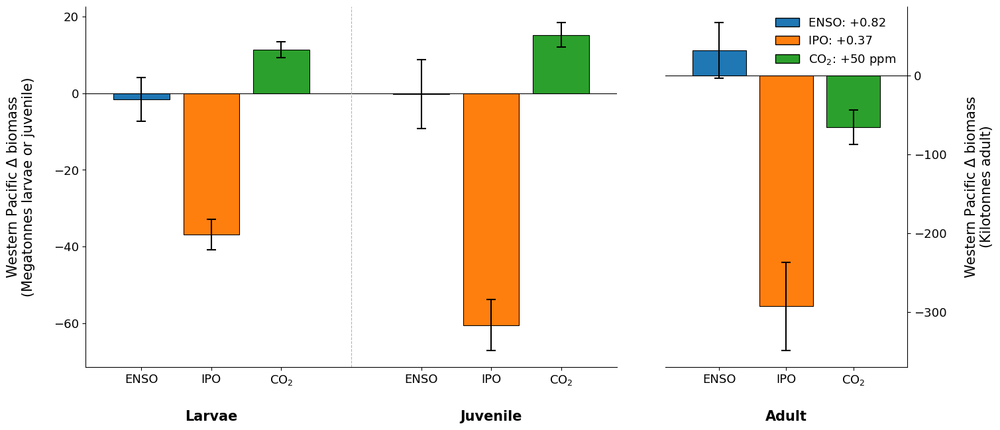

In [39]:

fslab = 15
fstic = 13

# Bar positions
xpos = np.array([1, 2, 3, 5, 6, 7, 9, 10, 11])

# Central estimates
values = np.array([enso_larvae_sum.item(), ipo_larvae_sum.item(), co2_larvae_sum.item(),
                   enso_juvenile_sum.item(), ipo_juvenile_sum.item(), co2_juvenile_sum.item(),
                   enso_adult_sum.item(), ipo_adult_sum.item(), co2_adult_sum.item()])*1e-6

# Lower confidence bounds
lower_bounds = np.array([enso_larvae_sum_nse.item(), ipo_larvae_sum_nse.item(), co2_larvae_sum_nse.item(),
                         enso_juvenile_sum_nse.item(), ipo_juvenile_sum_nse.item(), co2_juvenile_sum_nse.item(),
                         enso_adult_sum_nse.item(), ipo_adult_sum_nse.item(), co2_adult_sum_nse.item()])*1e-6

# Upper confidence bounds
upper_bounds = np.array([enso_larvae_sum_pse.item(), ipo_larvae_sum_pse.item(), co2_larvae_sum_pse.item(),
                         enso_juvenile_sum_pse.item(), ipo_juvenile_sum_pse.item(), co2_juvenile_sum_pse.item(),
                         enso_adult_sum_pse.item(), ipo_adult_sum_pse.item(), co2_adult_sum_pse.item()])*1e-6


# Convert confidence bounds into asymmetric error-bar lengths
lower_errors = values - lower_bounds
upper_errors = upper_bounds - values
yerr = np.vstack([lower_errors, upper_errors])

# Repeat colours for ENSO, IPO and CO2
bar_colors = ['tab:blue', 'tab:orange', 'tab:green',
              'tab:blue', 'tab:orange', 'tab:green',
              'tab:blue', 'tab:orange', 'tab:green']


fig = plt.figure(figsize=(16, 8))
gs = GridSpec(1, 3)

ax1 = plt.subplot(gs[0:2])
ax2 = plt.subplot(gs[2])
ax1.tick_params(labelsize=fstic)
ax1.spines[['top', 'right']].set_visible(False)
ax2.tick_params(labelsize=fstic, left=False, labelleft=False, right=True, labelright=True)
ax2.spines[['top', 'left']].set_visible(False)

args = {'width':0.8, 'color':bar_colors, 'edgecolor':'black', 'linewidth':0.8, 'capsize':5, 
        'error_kw':{'elinewidth': 1.5, 'capthick': 1.5}}

ax1.bar(xpos[0:-3], values[0:-3], yerr=yerr[:,0:-3], **args)
ax1.axhline(0, color='black', linewidth=0.8)
ax2.bar(xpos[0:3], values[-3::], yerr=yerr[:,-3::], **args)
ax2.axhline(0, color='black', linewidth=0.8)


# Label each bar by forcing
ax1.set_xticks(xpos[0:-3])
ax1.set_xticklabels(['ENSO'%(enso_std.values), 'IPO', 'CO$_2$'] * 2, fontsize=fstic)
ax2.set_xticks(xpos[0:3])
ax2.set_xticklabels(['ENSO'%(enso_std.values), 'IPO', 'CO$_2$'] * 1, fontsize=fstic)
ax1.set_ylabel('Western Pacific $\Delta$ biomass\n(Megatonnes larvae or juvenile)', fontsize=fslab, labelpad=20)
ax2.set_ylabel('Western Pacific $\Delta$ biomass\n(Kilotonnes adult)', fontsize=fslab, labelpad=20)
ax2.yaxis.set_label_position('right')

# Life-stage labels beneath each group
group_centres = [2, 6]; group_labels = ['Larvae', 'Juvenile']
for centre, label in zip(group_centres, group_labels):
    ax1.text(centre, -0.12, label, transform=ax1.get_xaxis_transform(), ha='center', va='top', fontsize=fslab, fontweight='bold')
group_centres = [2]; group_labels = ['Adult']
for centre, label in zip(group_centres, group_labels):
    ax2.text(centre, -0.12, label, transform=ax2.get_xaxis_transform(), ha='center', va='top', fontsize=fslab, fontweight='bold')

# Vertical separators between life stages
ax1.axvline(4, color='0.7', linewidth=0.8, linestyle='--')
ax1.axvline(8, color='0.7', linewidth=0.8, linestyle='--')
ax2.axvline(4, color='0.7', linewidth=0.8, linestyle='--')
ax2.axvline(8, color='0.7', linewidth=0.8, linestyle='--')

legend_handles = [
    Patch(facecolor='tab:blue', edgecolor='black', label='ENSO: +%.2f'%(enso_std.values)),
    Patch(facecolor='tab:orange', edgecolor='black', label='IPO: +%.2f'%(ipo_std.values)),
    Patch(facecolor='tab:green', edgecolor='black', label='CO$_2$: +50 ppm')
]

ax2.legend(handles=legend_handles, frameon=False, fontsize=fstic, loc='best')
ax1.set_xlim(0.2, 7.8)
ax2.set_xlim(0.2, 3.8)

plt.subplots_adjust(bottom=0.20)

fig.savefig("./figures/WesternPacific_biomass_changes.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/WesternPacific_biomass_changes_transparent.png", dpi=300, bbox_inches='tight', transparent=True)


In [40]:
print("ENSO change in larvae", values[0], yerr[:,0])
print("ENSO change in juveniles", values[3], yerr[:,3])
print("ENSO change in adults", values[6], yerr[:,6])
print("")
print("IPO change in larvae", values[1], yerr[:,1])
print("IPO change in juveniles", values[4], yerr[:,4])
print("IPO change in adults", values[7], yerr[:,7])
print("")
print("50ppm CO2 change in larvae", values[2], yerr[:,2])
print("50ppm CO2 change in juveniles", values[5], yerr[:,5])
print("50ppm CO2 change in adults", values[8], yerr[:,8])


ENSO change in larvae -1.648291982607907 [5.68236974 5.68236974]
ENSO change in juveniles -0.22727849804735345 [9.00183717 9.00183717]
ENSO change in adults 31.656558728227864 [35.2687857 35.2687857]

IPO change in larvae -36.90403862672838 [4.04079876 4.04079876]
IPO change in juveniles -60.51799473698452 [6.63754991 6.63754991]
IPO change in adults -292.5738520423833 [56.00234754 56.00234754]

50ppm CO2 change in larvae 11.349143694315329 [2.00582328 2.00582328]
50ppm CO2 change in juveniles 15.150503853150472 [3.20032551 3.20032551]
50ppm CO2 change in adults -65.61715288060579 [21.62734692 21.62734692]


### Save the standard effects of ENSO, IPO and climate change on predictors

In [35]:
%%time

std = enso_da.std().values
ds = xr.Dataset(
    data_vars={
        "ENSO_T_L1_effect":  enso_T_L1_slope.T  * std,
        "ENSO_SST_effect":   enso_sst_slope.T   * std,
        "ENSO_U_L3_effect":  enso_U_L3_slope.T  * std,
        "ENSO_O2_L2_effect": enso_O2_L2_slope.T * std * 44.661,
        "ENSO_ZEU_effect":   enso_zeu_slope.T   * std,
        "ENSO_T_L2_effect":  enso_T_L2_slope.T  * std,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_ENSO_on_predictors.nc"
)

std = ipo_da.std().values
ds = xr.Dataset(
    data_vars={
        "IPO_T_L1_effect":  ipo_T_L1_slope.T  * std,
        "IPO_SST_effect":   ipo_sst_slope.T   * std,
        "IPO_U_L3_effect":  ipo_U_L3_slope.T  * std,
        "IPO_O2_L2_effect": ipo_O2_L2_slope.T * std * 44.661,
        "IPO_ZEU_effect":   ipo_zeu_slope.T   * std,
        "IPO_T_L2_effect":  ipo_T_L2_slope.T  * std,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_IPO_on_predictors.nc"
)

ds = xr.Dataset(
    data_vars={
        "CC_T_L1_effect":  cc_T_L1_slope.T  * 100,
        "CC_SST_effect":   cc_sst_slope.T   * 100,
        "CC_U_L3_effect":  cc_U_L3_slope.T  * 100,
        "CC_O2_L2_effect": cc_O2_L2_slope.T * 100 * 44.661,
        "CC_ZEU_effect":   cc_zeu_slope.T   * 100,
        "CC_T_L2_effect":  cc_T_L2_slope.T  * 100,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_CC_on_predictors.nc"
)


CPU times: user 483 ms, sys: 177 ms, total: 660 ms
Wall time: 1.05 s


### Save all of these correlations and slopes to netcdfs for EEZ cutouts for Thomas

In [31]:
(enso_T_L1_tuna_slope.T * enso_da.std().values)

<xarray.DataArray (lat: 40, lon: 120)> Size: 38kB
array([[         nan,          nan,          nan, ...,   0.28013393,
          0.27225088,   0.16303599],
       [         nan,          nan,          nan, ...,   0.63474133,
          0.27269729,   0.52004186],
       [         nan,          nan,          nan, ...,   0.82995272,
          0.99556664,   0.73602544],
       ...,
       [-16.24221214,          nan,  -9.35730734, ...,   3.91974373,
          2.37508305,   3.53487041],
       [-10.25683154,          nan,  -8.49249294, ...,   2.68526873,
          2.89024335,   3.93800282],
       [ -4.84718789,  -4.61887171,  -3.69071499, ...,   1.56621476,
          1.69091521,   3.5781291 ]], shape=(40, 120))
Coordinates:
  * lon      (lon) float64 960B 120.5 121.5 122.5 123.5 ... 237.5 238.5 239.5
  * lat      (lat) float64 320B -19.5 -18.5 -17.5 -16.5 ... 16.5 17.5 18.5 19.5

In [32]:
%%time

std = enso_da.std().values
ds = xr.Dataset(
    data_vars={
        "ENSO_T_L1_effect":  enso_T_L1_tuna_slope.T  * std,
        "ENSO_SST_effect":   enso_sst_tuna_slope.T   * std,
        "ENSO_U_L3_effect":  enso_U_L3_tuna_slope.T  * std,
        "ENSO_O2_L2_effect": enso_O2_L2_tuna_slope.T * std,
        "ENSO_ZEU_effect":   enso_zeu_tuna_slope.T   * std,
        "ENSO_T_L2_effect":  enso_T_L2_tuna_slope.T  * std,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_ENSO_on_Skipjack_allpredictors.nc"
)

std = ipo_da.std().values
ds = xr.Dataset(
    data_vars={
        "IPO_T_L1_effect":  ipo_T_L1_tuna_slope.T  * std,
        "IPO_SST_effect":   ipo_sst_tuna_slope.T   * std,
        "IPO_U_L3_effect":  ipo_U_L3_tuna_slope.T  * std,
        "IPO_O2_L2_effect": ipo_O2_L2_tuna_slope.T * std,
        "IPO_ZEU_effect":   ipo_zeu_tuna_slope.T   * std,
        "IPO_T_L2_effect":  ipo_T_L2_tuna_slope.T  * std,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_IPO_on_Skipjack_allpredictors.nc"
)

ds = xr.Dataset(
    data_vars={
        "CC_T_L1_effect":  cc_T_L1_tuna_slope.T  * 100,
        "CC_SST_effect":   cc_sst_tuna_slope.T   * 100,
        "CC_U_L3_effect":  cc_U_L3_tuna_slope.T  * 100,
        "CC_O2_L2_effect": cc_O2_L2_tuna_slope.T * 100,
        "CC_ZEU_effect":   cc_zeu_tuna_slope.T   * 100,
        "CC_T_L2_effect":  cc_T_L2_tuna_slope.T  * 100,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_CC_on_Skipjack_allpredictors.nc"
)


CPU times: user 266 ms, sys: 35.9 ms, total: 302 ms
Wall time: 433 ms
